<a href="https://colab.research.google.com/github/Sanketkamble01/Email_Campaign_Effectiveness_Prediction/blob/main/Netflix_Movies_and_TV_Shows_Clustering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    - **$\color{red}{\text{Netflix Movies and TV Shows Clustering}}$**



##### **Project Type**    -  Unsupervised ML
##### **Contribution**    -  Individual
##### **Team Member 1**-  $\color{blue}{\text{Sanket Kamble}}$

# **Project Summary -**

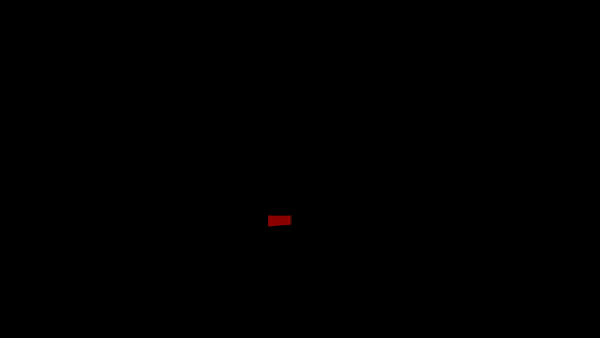

The dataset under examination includes details about Netflix's 2019 lineup of TV series and films. The information came from the third-party Netflix search engine Flixable. An interesting report by Flixable in 2018 showed that during the period of 2010 to 2018, the quantity of TV shows available on Netflix had almost tripled, whereas the quantity of movies had dropped by over 2,000 titles.

We started by comprehending the dataset's structure and contents in order to extract useful insights from it. After that, data cleaning was done to make sure the information was prepared for analysis. We were able to see patterns, trends, and the general behavior of the dataset thanks to exploratory data analysis, or EDA.

 We used a variety of text preprocessing techniques, like removing stop words, white spaces, and numbers, to get the data ready for clustering. As a result, we were able to find important terms that would make good clustering parameters.

 Next, we used the k-means elbow method and the silhouette method to figure out how many clusters would be best for our analysis. These techniques made it possible for us to categorize films and TV series according to shared traits.

 Lastly, we developed a recommender system by measuring the similarity between items in the dataset using a method called cosine similarity. The top 5 movies that are most similar to a user's chosen selections are suggested by us using cosine similarity.

 In summary, the examination of the Netflix dataset yielded significant understanding of how the platform's content offerings have evolved over time. By helping users find relevant TV series and movies based on their tastes, the clustering and recommender system improved their overall streaming experience.


# **GitHub Link -**

https://github.com/Sanketkamble01/Netflix-Movies-and-TV-Shows-Clustering



# **Problem Statement**





**This dataset consists of tv shows and movies available on Netflix as of 2019. The dataset is collected from Flixable which is a third-party Netflix search engine. In 2018, they released an interesting report which shows that the number of TV shows on Netflix has nearly tripled since 2010. The streaming service’s number of movies has decreased by more than 2,000 titles since 2010, while its number of TV shows has nearly tripled. It will be interesting to explore what all other insights can be obtained from the same dataset.**

**Integrating this dataset with other external datasets such as IMDB ratings, rotten tomatoes can also provide many interesting findings.**

# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required.
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits.
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule.

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [1]:
# Import Libraries
# Data Maipulation Libraries
import numpy as np
import pandas as pd
import datetime as dt


# libraries used to process textual data
import string
string.punctuation
import nltk
nltk.download('punkt')
import re
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from nltk.tokenize import TweetTokenizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from nltk.stem.snowball import SnowballStemmer
from sklearn.preprocessing import StandardScaler

# libraries used to implement clusters
from sklearn.metrics import silhouette_score
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from scipy.cluster.hierarchy import dendrogram


# Data Visualisation Libraray
import matplotlib.pyplot as plt
from matplotlib.cm import ScalarMappable
from wordcloud import WordCloud, STOPWORDS
import seaborn as sns
%matplotlib inline
import plotly.graph_objects as go


# Library of warnings would assist in ignoring warnings issued
import warnings;warnings.filterwarnings('ignore')
import warnings;warnings.simplefilter('ignore')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


### Dataset Loading

In [2]:
# Mounting the drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# Load Dataset
df= pd.read_csv('/content/drive/MyDrive/Capstone project 4/NETFLIX MOVIES AND TV SHOWS CLUSTERING.csv')

### Dataset First View

In [4]:
# Dataset First Look
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...


### Dataset Rows & Columns count

In [5]:
# Dataset Rows & Columns count
print(f'The number of rows and columns in the dataset : Rows = {df.shape[0]}, Columns = {df.shape[1]}')

The number of rows and columns in the dataset : Rows = 7787, Columns = 12


### Dataset Information

In [6]:
# Dataset Info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7787 non-null   object
 1   type          7787 non-null   object
 2   title         7787 non-null   object
 3   director      5398 non-null   object
 4   cast          7069 non-null   object
 5   country       7280 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7787 non-null   int64 
 8   rating        7780 non-null   object
 9   duration      7787 non-null   object
 10  listed_in     7787 non-null   object
 11  description   7787 non-null   object
dtypes: int64(1), object(11)
memory usage: 730.2+ KB


#### Duplicate Values

In [7]:
# Dataset Duplicate Value Count
print(f'The sum of observations that have been duplicated in the dataset is {df.duplicated().sum()}')

The sum of observations that have been duplicated in the dataset is 0


#### Missing Values/Null Values

In [8]:
# Missing Values/Null Values Count
print("-" * 50)
print("Null value count in each variable:")
print("-" * 50)
null_count = df.isna().sum()
print(null_count)
print("-" * 50)

# Percentage of null values in each variable
print("Percentage of null values in each variable:")
print("-" * 50)
null_percentage = null_count / len(df) * 100
print(null_percentage)
print("-" * 50)


--------------------------------------------------
Null value count in each variable:
--------------------------------------------------
show_id            0
type               0
title              0
director        2389
cast             718
country          507
date_added        10
release_year       0
rating             7
duration           0
listed_in          0
description        0
dtype: int64
--------------------------------------------------
Percentage of null values in each variable:
--------------------------------------------------
show_id          0.000000
type             0.000000
title            0.000000
director        30.679337
cast             9.220496
country          6.510851
date_added       0.128419
release_year     0.000000
rating           0.089893
duration         0.000000
listed_in        0.000000
description      0.000000
dtype: float64
--------------------------------------------------


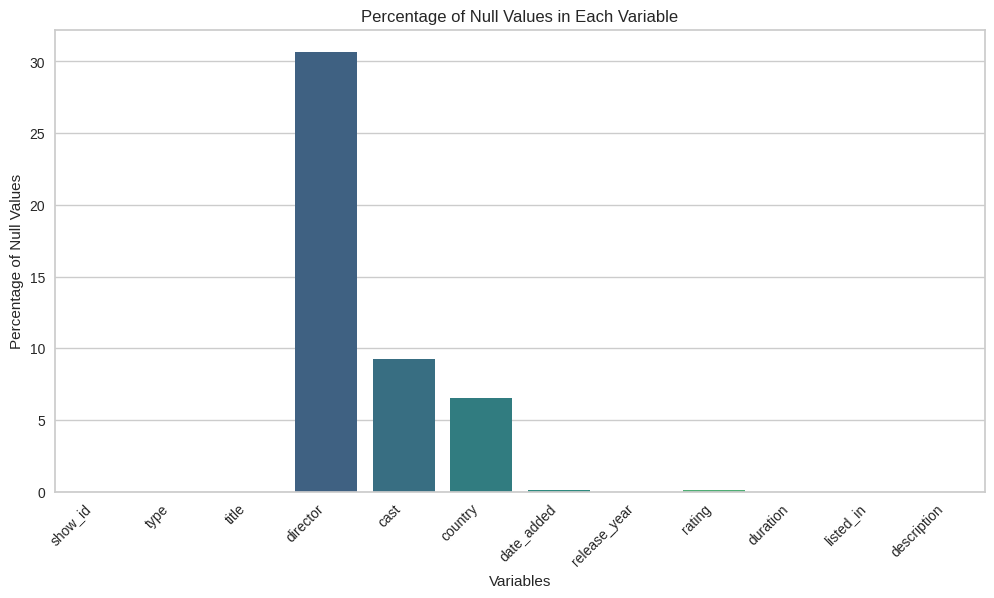

In [9]:
# Visualizing the missing values00000
plt.figure(figsize=(12, 6))
sns.barplot(x=null_percentage.index, y=null_percentage.values, palette="viridis")
plt.title("Percentage of Null Values in Each Variable")
plt.xlabel("Variables")
plt.ylabel("Percentage of Null Values")
plt.xticks(rotation=45, ha="right")
plt.show()

### What did you know about your dataset?

* The dataset, which has 7787 rows and 12 columns with only one integer data type, contains information on several features and is used for Netflix movie and TV show clustering. While there are no duplicate values in it, the director, cast, country, date_added, and rating columns all have null values.

* This dataset is an invaluable tool for investigating patterns in the selection of films and television series that Netflix offers. Furthermore, it can be employed in the creation of clustering models that group related titles according to common characteristics like genre, nation of origin, and rating.

## ***2. Understanding Your Variables***

In [10]:
# Dataset Columns
print(f'Available columns:\n{df.columns.to_list()}')

Available columns:
['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added', 'release_year', 'rating', 'duration', 'listed_in', 'description']


In [11]:
# Dataset Describe
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
show_id,7787,7787,s1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
type,7787,2,Movie,5377,NaN,NaN,NaN,NaN,NaN,NaN,NaN
title,7787,7787,3%,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
director,5398,4049,"Raúl Campos, Jan Suter",18,NaN,NaN,NaN,NaN,NaN,NaN,NaN
cast,7069,6831,David Attenborough,18,NaN,NaN,NaN,NaN,NaN,NaN,NaN
country,7280,681,United States,2555,NaN,NaN,NaN,NaN,NaN,NaN,NaN
date_added,7777,1565,"January 1, 2020",118,NaN,NaN,NaN,NaN,NaN,NaN,NaN
release_year,7787.0,NaN,NaN,NaN,2013.93258,8.757395,1925.0,2013.0,2017.0,2018.0,2021.0
rating,7780,14,TV-MA,2863,NaN,NaN,NaN,NaN,NaN,NaN,NaN
duration,7787,216,1 Season,1608,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Variables Description

1. show_id : Unique ID for every Movie / Tv Show

2. type : Identifier - A Movie or TV Show

3. title : Title of the Movie / Tv Show

4. director : Director of the Movie

5. cast : Actors involved in the movie / show

6. country : Country where the movie / show was produced

7. date_added : Date it was added on Netflix

8. release_year : Actual Releaseyear of the movie / show

9. rating : TV Rating of the movie / show

10. duration : Total Duration - in minutes or number of seasons

11. listed_in : Genere

12. description : The Summary description

### Check Unique Values for each variable.

In [12]:
# Check Unique Values for each variable.
for i in df.columns.tolist():
  print("Number of unique values in", i , "is" , df[i].nunique(), ".")

Number of unique values in show_id is 7787 .
Number of unique values in type is 2 .
Number of unique values in title is 7787 .
Number of unique values in director is 4049 .
Number of unique values in cast is 6831 .
Number of unique values in country is 681 .
Number of unique values in date_added is 1565 .
Number of unique values in release_year is 73 .
Number of unique values in rating is 14 .
Number of unique values in duration is 216 .
Number of unique values in listed_in is 492 .
Number of unique values in description is 7769 .


## 3. ***Data Wrangling***

### Data Wrangling Code

In [13]:
# Write your code to make your dataset analysis ready.
# Summ of null values
print('Missing Data Count')
df.isna().sum()[df.isna().sum() > 0].sort_values(ascending=False)

Missing Data Count


director      2389
cast           718
country        507
date_added      10
rating           7
dtype: int64

In [14]:
# imputing with unknown in null values of director , cast and country feature
df[['director','cast','country']]=df[['director','cast','country']].fillna("Unknown")

In [15]:
#We can replace the missing values in the 'rating' column with mode because it is a discrete attribute and delete 'date_added'.
df['rating'].fillna(value=df['rating'].mode()[0],inplace=True)
df.dropna(subset=['date_added'], inplace=True)

In [16]:
df.shape

(7777, 12)

In [17]:
df.isnull().sum()

show_id         0
type            0
title           0
director        0
cast            0
country         0
date_added      0
release_year    0
rating          0
duration        0
listed_in       0
description     0
dtype: int64

In [18]:
#To make the analysis easier, we'll pick the primary country and primary genre for every entry in the dataframe.
df['country'] = df['country'].apply(lambda x: x.split(',')[0])
df['listed_in'] = df['listed_in'].apply(lambda x: x.split(',')[0])
df['duration'] = df['duration'].apply(lambda x: int(x.split()[0]))

In [19]:
# datatype of duration
df.duration.dtype

dtype('int64')

In [20]:
pd.DataFrame(df.dtypes).rename(columns = {0:'dtype'})

,dtype
show_id,object
type,object
title,object
director,object
cast,object
country,object
date_added,object
release_year,int64
rating,object
duration,int64


In [21]:
#Convert timestamp to datetime format to fetch the other details
df["date_added"] = pd.to_datetime(df['date_added'])

In [22]:
#Adding new columns to the dataframe, such as'month_added' and 'year_added', can help gain more insights from the data.
df["day_added"]= df["date_added"].dt.day
df["month_added"]= df["date_added"].dt.month
df["year_added"]= df["date_added"].dt.year


In [23]:
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,day_added,month_added,year_added
0,s1,TV Show,3%,Unknown,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020-08-14,2020,TV-MA,4,International TV Shows,In a future where the elite inhabit an island ...,14,8,2020
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016-12-23,2016,TV-MA,93,Dramas,After a devastating earthquake hits Mexico Cit...,23,12,2016
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2018-12-20,2011,R,78,Horror Movies,"When an army recruit is found dead, his fellow...",20,12,2018
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2017-11-16,2009,PG-13,80,Action & Adventure,"In a postapocalyptic world, rag-doll robots hi...",16,11,2017
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2020-01-01,2008,PG-13,123,Dramas,A brilliant group of students become card-coun...,1,1,2020


 **Binning of Rating attribute**
 Different categories are included in the rating columns; these are content rating classifications that are frequently used in the US and other nations to show which media content is appropriate for which age groups.Let's simplify it and make bins as follows:

**Mature Audiences and Adults:**

* TV-MA (Mature Audiences Only)
* R (17 and older)
* NC-17 (Adults Only)

**Teen and Parental Guidance:**
* PG-13 (Parents Strongly Cautioned, may not be suitable for children under 13)

* TV-14 (Parents Strongly Cautioned, may not be suitable for children under 14)

**Parental Guidance:**
* PG (Parental Guidance Suggested, may not be suitable for children under 10)

* TV-PG (Parental Guidance Suggested, may not be suitable for children under 8)

**General Audiences and Children:**
* G (General Audiences)

* TV-G (General Audience)
* TV-Y (All Children)
* TV-Y7 (Directed to Older Children, may not be suitable for children under 7)
* TV-Y7-FV (Directed to Older Children, Fantasy Violence)

**Not Rated/Unrated:**

* NR (Not Rated)
* UR (Unrated)

In [24]:
#Modify the values in the rating column.
#Create a dictionary to map the current ratings to the new ones
rating_map = {'TV-MA':'Mature Audiences and Adults',
'R':'Mature Audiences and Adults',
'PG-13':'Teen and Parental Guidance',
'TV-14':'Teen and Parental Guidance',
'TV-PG':'Parental Guidance',
'NR':'Not Rated/Unrated',
'TV-G':'General Audiences and Children',
'TV-Y':'General Audiences and Children',
'TV-Y7':'General Audiences and Children',
'PG':'Parental Guidance',
'G':'General Audiences and Children',
'NC-17':'Mature Audiences and Adults',
'TV-Y7-FV':'General Audiences and Children',
'UR':'Not Rated/Unrated'}
# Replace the current ratings with the new ratings using the mapping dictionary
df['rating'].replace(rating_map,inplace=True)
# Print the unique values in the 'rating' column to verify that the changes have been made
print(df['rating'].unique())

['Mature Audiences and Adults' 'Teen and Parental Guidance'
 'Parental Guidance' 'Not Rated/Unrated' 'General Audiences and Children']


### What all manipulations have you done and insights you found?

> The null values have been imputed/dropped in this section.:
Imputed 'director','country' and 'cast' with 'Unknown'.
Imputed 'rating' with Mode.
Drop null values of 'date_added' (less percentage).

>To make the analysis easier, the primary country and primary genre were selected for each entry in the dataframe.

>Datetime format was used to convert the timestamp in the "date_added" column in order to retrieve additional information.

> Additionally, in order to extract more information from the data, new columns like "Day_added," "month_added," and "year_added" were added to the dataframe.

>Because the "rating" column has multiple coded categories, we have created five bins and divided the values among them:
>
>'Mature Audiences and Adults' 'Teen and Parental Guidance'
 'Parental Guidance' 'Not Rated/Unrated' 'General Audiences and Children'

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - 1

In [25]:
#When did Netflix start to grow?
df['release_year'].value_counts()

2018    1120
2017    1012
2019     996
2016     881
2020     868
        ... 
1925       1
1964       1
1966       1
1947       1
1959       1
Name: release_year, Length: 73, dtype: int64

Since there are many years that have only one value, I am only taking into account the year 2000.

In [26]:
# movies released after 2000
growth_year = df[df['release_year'] > 2000]

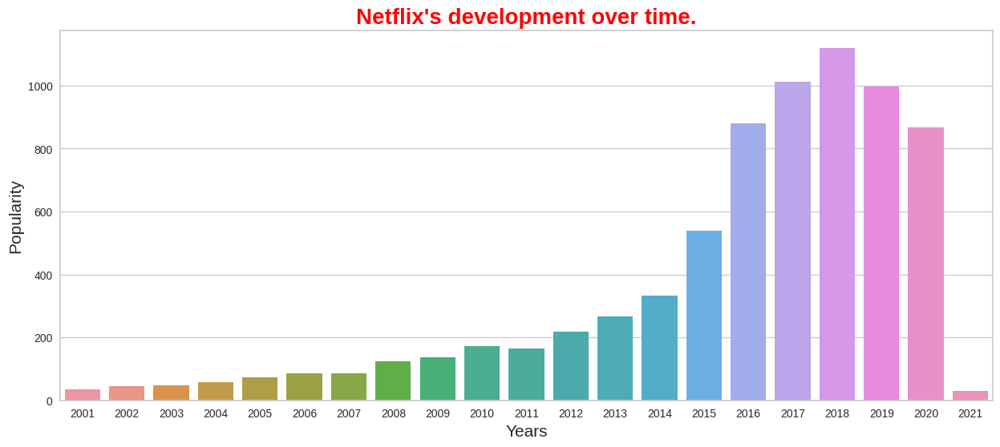

In [27]:
# Chart - 1 visualization code
# figure size
plt.figure(figsize=(15, 6))

# visualizing countplot
sns.countplot(data=growth_year, x='release_year')
plt.title("Netflix's development over time.", size=20, color='red', weight='bold')
plt.xlabel("Years", size=15)
plt.ylabel("Popularity", size=15)
plt.show()

##### 1. Why did you pick the specific chart?

>Bar chart showing Netflix's evolution over time . This chart is a suitable option for examining how Netflix's popularity has changed over time and can offer insightful information.The chart's visual appeal and easy readability are enhanced by its use of color.

##### 2. What is/are the insight(s) found from the chart?

Netflix started becomming popular after 2008.
After 2015, it get a boost in it's growth.
Now we all know that Netflix is one of the most famous OTT platform.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Yes this Will the gained insights help creating a positive business impact.

Because Investor Confidence: Consistently growing and becoming more popular among users may instill confidence in investors and help them view Netflix as a successful and viable platform. Competitive Edge: By predicting changes in the market and outpacing rivalry in the industry, an understanding of past trends can give an advantage over competitors.

#### Chart - 2

In [28]:
# Create a copy of df as df_new
df_new = df.copy()

# Print column names for df_new
print(f"Columns for Overall: {df_new.columns}")

# The ratings of Movies and TV Shows
# Movies
df_movies = df_new[df_new['type'] == 'Movie']['rating'].reset_index(drop=True)

# TV Shows
df_tvshows = df_new[df_new['type'] == 'TV Show']['rating'].reset_index(drop=True)



Columns for Overall: Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description',
       'day_added', 'month_added', 'year_added'],
      dtype='object')


Columns for Movies: Index(['rating'], dtype='object')
Columns for TV Shows: Index(['rating'], dtype='object')


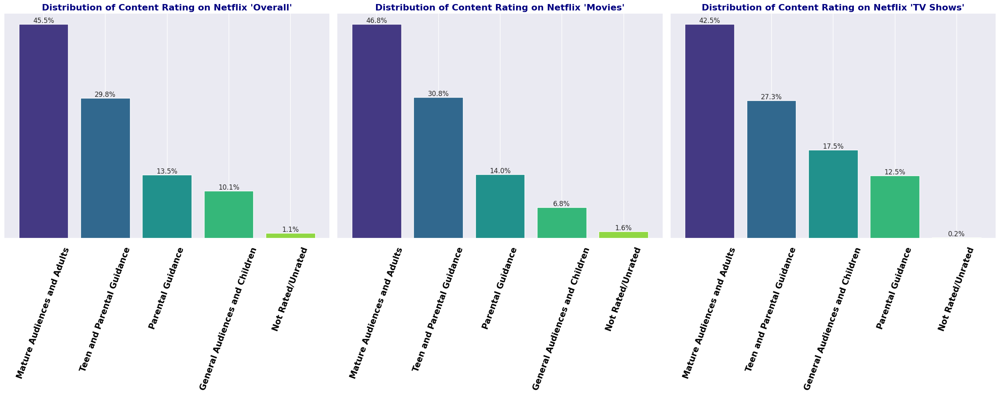

In [29]:
# Create a copy of df as df_new
df_new = df.copy()

# The ratings of Movies and TV Shows
# Movies
df_movies = df_new[df_new['type'] == 'Movie'][['rating']].reset_index(drop=True)
# Print column names for df_movies
print(f"Columns for Movies: {df_movies.columns}")

# TV Shows
df_tvshows = df_new[df_new['type'] == 'TV Show'][['rating']].reset_index(drop=True)
# Print column names for df_tvshows
print(f"Columns for TV Shows: {df_tvshows.columns}")

# Chart - 2 visualization code
# Set seaborn style
sns.set(style="darkgrid")
plt.figure(figsize=(25, 10))

# Loop through the dataframes and plot the bar charts
for i, (current_df, title, k) in enumerate(zip([df_new, df_movies, df_tvshows], ['Overall', 'Movies', 'TV Shows'], [0, 1, 2]), start=1):
    plt.subplot(1, 3, k + 1)
    count = current_df['rating'].value_counts()

    # Use seaborn default color palette and add 'viridis' colormap
    bar_colors = sns.color_palette("viridis", n_colors=len(count))
    bars = plt.bar(count.index, count, color=bar_colors)
    plt.title(f"Distribution of Content Rating on Netflix '{title}'", fontsize=16, fontweight='bold', color='navy')

    # Customize x-axis labels: make them brighter and rotate 45 degrees
    plt.xticks(rotation=70, color='black', fontweight='bold', fontsize=15)

    # Remove unnecessary y-axis labels
    plt.yticks([])

    # Add total percentage number at the top of each bar
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width() / 2, height, f'{height / sum(count) * 100:.1f}%', ha='center', va='bottom')

# Adjust layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()



##### 1. Why did you pick the specific chart?

> To see how the Netflix dataset's content ratings are distributed, I chose this chart. This chart tries to depict the proportion of data within each category, which is a useful feature of bar charts.

##### 2. What is/are the insight(s) found from the chart?

> 1.We discovered that the majority of Netflix's content belongs to the categories of 'mature audiences and adults' and the 'teens and parental guides.'
>
>2.It can be observed that movies lack content for a general audience and children when compared to TV shows.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

> By informing decisions about content acquisition and creation, these insights could have a positive impact on business. For example, the fact that the most popular rating is for adults and mature audiences indicates that there is a significant market for mature content on the platform, which may help determine what kinds of content to create or acquire.

#### Chart - 3

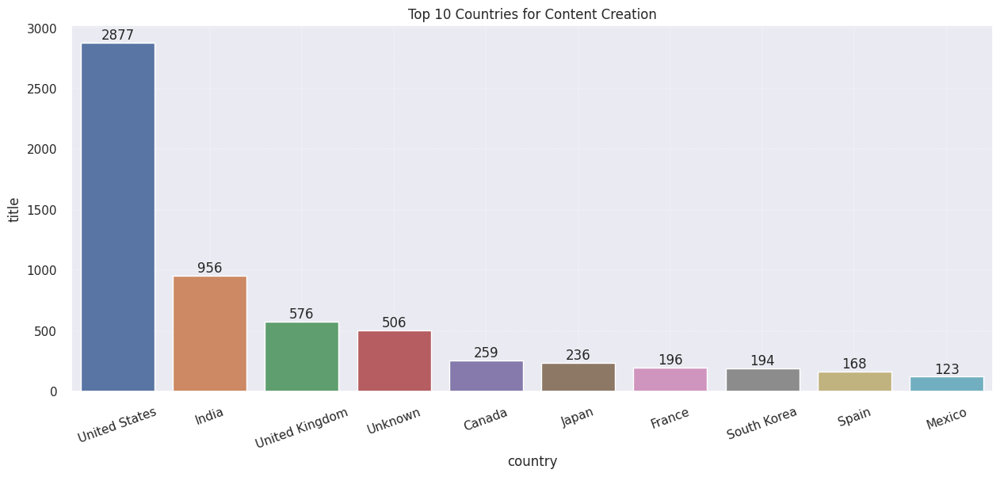

In [30]:
# Chart - 3 visualization code
# top 10 countries contribution to netflix
df_country = df.groupby(['country']).agg({'title': 'nunique'}).reset_index().sort_values(by=['title'], ascending=False)[:10]
plt.figure(figsize=(15, 6))
plots = sns.barplot(x='country', y='title', data=df_country)
plt.xticks(rotation=20)
plt.title('Top 10 Countries for Content Creation')
plt.grid(linestyle='--', linewidth=0.3)
plots.bar_label(plots.containers[0])
plt.show()


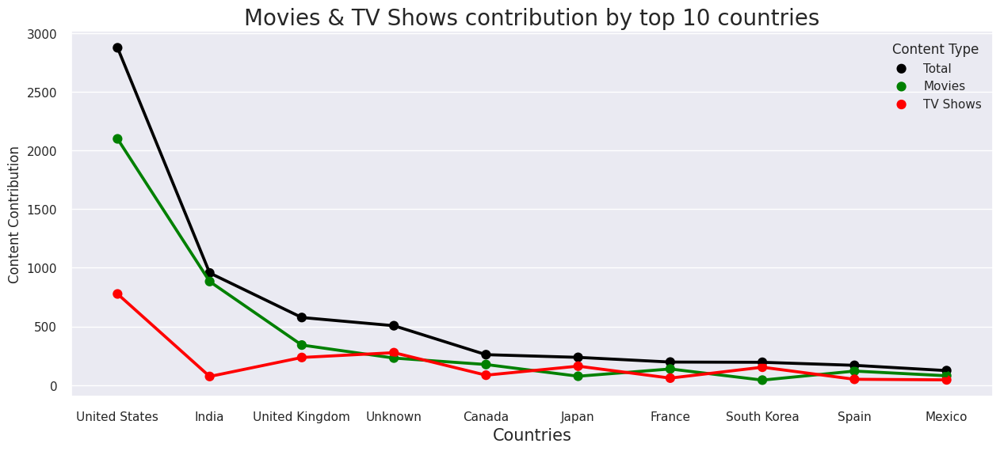

In [31]:
# Separate DataFrames for movies and TV shows
df_movies = df[df['type'] == 'Movie'].groupby('country')['title'].nunique().reset_index(name='movies')
df_tv_shows = df[df['type'] == 'TV Show'].groupby('country')['title'].nunique().reset_index(name='tv_shows')

# Merging the DataFrames
df_country = df_movies.merge(df_tv_shows, on='country', how='outer').fillna(0)
df_country['total'] = df_country['movies'] + df_country['tv_shows']

# Selecting the top 10 countries
df_top10 = df_country.nlargest(10, 'total')

# Setting the figure size
plt.figure(figsize=(15, 6))

# Visualizing pointplot plot for the top 10 countries
sns.pointplot(data=df_top10, x='country', y='total', color='black', label='Total')
sns.pointplot(data=df_top10, x='country', y='movies', color='green', label='Movies')
sns.pointplot(data=df_top10, x='country', y='tv_shows', color='red', label='TV Shows')

# Adding legend
plt.legend(title='Content Type', loc='upper right')

plt.title("Movies & TV Shows contribution by top 10 countries", size=20)
plt.xlabel("Countries", size=15)
plt.ylabel("Content Contribution")
plt.show()


##### 1. Why did you pick the specific chart?

> I chose this graph because it lists the top ten nations in the dataset for the most movies and TV series. This is crucial information for any company trying to get into or grow in the international streaming market.

##### 2. What is/are the insight(s) found from the chart?

> * Netflix has the highest number of content contributions from the United States among all countries.
* The nations that are contributing more content to Netflix after the US are India, the UK, Canada, Japan, and France.
* India is producing more movies, but not as many TV shows.
* With the exception of South Korea and Japan, every nation contributes more films than television series.


##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

> Absolutely, by pointing out areas for improvement and expansion—like investing in Bollywood and American content and gaining access to a wider variety of content—the insights gathered can benefit Netflix's operations.

#### Chart - 4

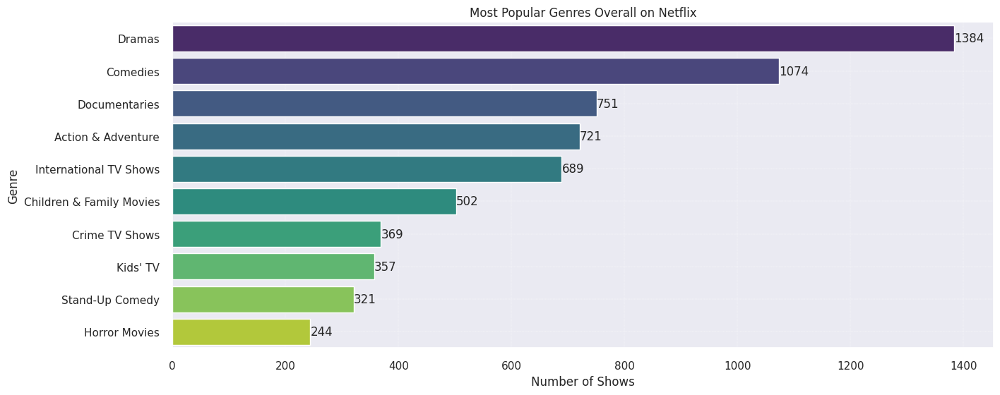

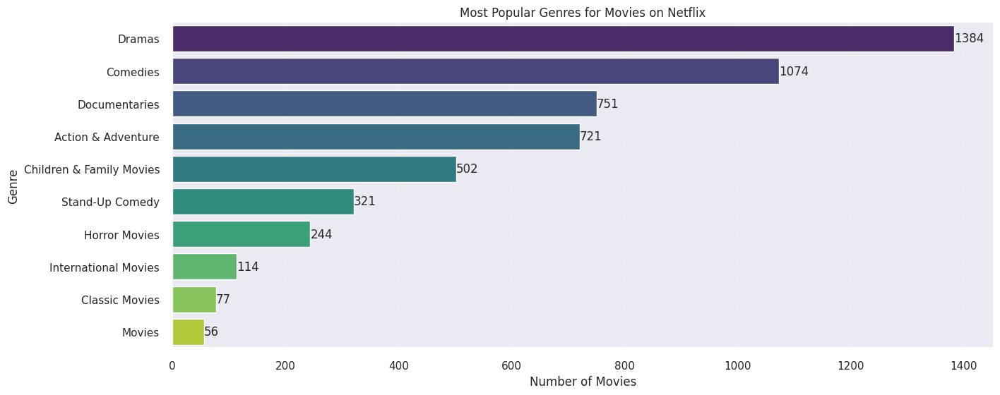

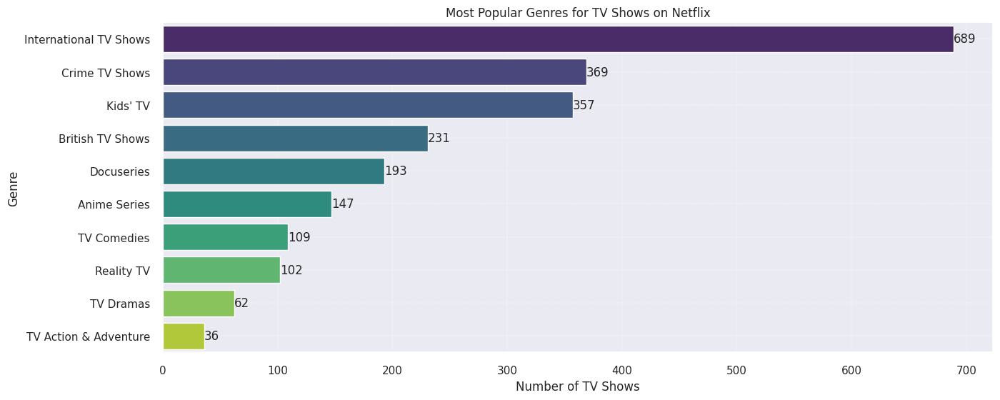

In [32]:
# Set seaborn style
sns.set(style="darkgrid")

# Overall Genres
plt.figure(figsize=(15, 6))
df_overall_genres = df.groupby(['listed_in']).agg({'show_id': 'count'}).reset_index().sort_values(by=['show_id'], ascending=False)[:10]
plots = sns.barplot(x='show_id', y='listed_in', data=df_overall_genres, palette='viridis')
plt.title('Most Popular Genres Overall on Netflix')
plt.xlabel('Number of Shows')
plt.ylabel('Genre')
plt.grid(linestyle='--', linewidth=0.3)
plots.bar_label(plots.containers[0], fmt='%d')
plt.show()

# Genres for Movies
plt.figure(figsize=(15, 6))
df_movies_genres = df[df['type'] == 'Movie'].groupby(['listed_in']).agg({'show_id': 'count'}).reset_index().sort_values(by=['show_id'], ascending=False)[:10]
plots = sns.barplot(x='show_id', y='listed_in', data=df_movies_genres, palette='viridis')
plt.title('Most Popular Genres for Movies on Netflix')
plt.xlabel('Number of Movies')
plt.ylabel('Genre')
plt.grid(linestyle='--', linewidth=0.3)
plots.bar_label(plots.containers[0], fmt='%d')
plt.show()

# Genres for TV Shows
plt.figure(figsize=(15, 6))
df_tvshows_genres = df[df['type'] == 'TV Show'].groupby(['listed_in']).agg({'show_id': 'count'}).reset_index().sort_values(by=['show_id'], ascending=False)[:10]
plots = sns.barplot(x='show_id', y='listed_in', data=df_tvshows_genres, palette='viridis')
plt.title('Most Popular Genres for TV Shows on Netflix')
plt.xlabel('Number of TV Shows')
plt.ylabel('Genre')
plt.grid(linestyle='--', linewidth=0.3)
plots.bar_label(plots.containers[0], fmt='%d')
plt.show()

##### 1. Why did you pick the specific chart?

> The most popular genre on Netflix is revealed by this graph.

##### 2. What is/are the insight(s) found from the chart?

>  From this chart, we can infer that dramas are the most popular genre for overall and the movies in the dataset, with comedies and documentaries following closely behind.

>The TV shows category has the highest popularity for international movie genre, followed by crime TV shows and kids TV shows.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

> By helping Netflix better understand its audience's preferences for content, the insights gleaned from the chart can have a positive business impact. Their viewership and revenue may rise if they use this information to help them make better decisions about the kind of content they should create and

#### Chart - 5

**Netflix releases and adds a total of movies and TV shows every year.**

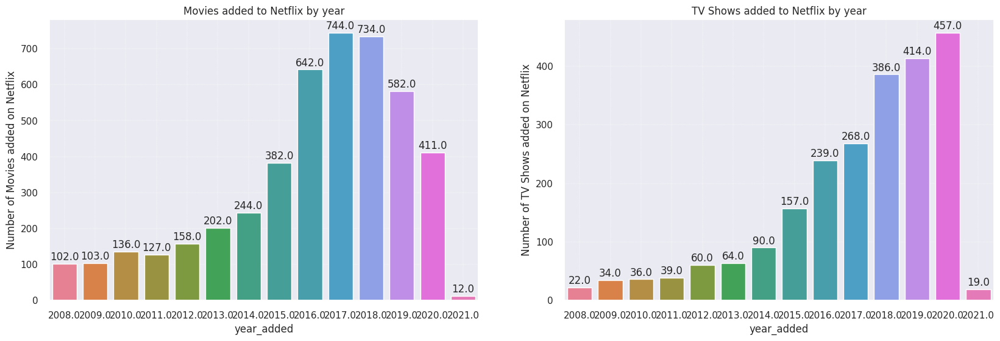

In [130]:
# Extract the year from the date_added column and create a new column 'year_added'
df['year_added'] = df['release_year'].where(df['release_year'] > 2007)

# Setting the figure size
plt.figure(figsize=(20, 6))

for i, j, k in ((df[df['type'] == 'Movie'], 'Movies', 0), (df[df['type'] == 'TV Show'], 'TV Shows', 1)):
    plt.subplot(1, 2, k + 1)
    df_added_year = i.groupby(['year_added']).agg({'title': 'nunique'}).reset_index().sort_values(
        by=['year_added'], ascending=False)
    plots = sns.barplot(x='year_added', y='title', data=df_added_year, palette='husl')
    plt.title(f'{j} added to Netflix by year')
    plt.ylabel(f"Number of {j} added on Netflix")
    plt.grid(linestyle='--', linewidth=0.3)

    for bar in plots.patches:
        plt.annotate(bar.get_height(),
                     (bar.get_x() + bar.get_width() / 2,
                      bar.get_height()), ha='center', va='center',
                     size=12, xytext=(0, 8),
                     textcoords='offset points')

plt.show()

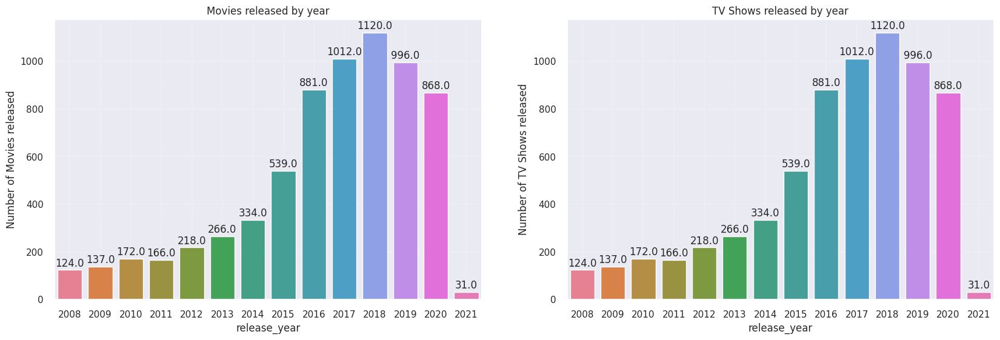

In [122]:
# Separate DataFrames for movies and TV shows
df_movies = df[df['type'] == 'Movie'].groupby('country')['title'].nunique().reset_index(name='movies')
df_tv_shows = df[df['type'] == 'TV Show'].groupby('country')['title'].nunique().reset_index(name='tv_shows')

# Merging the DataFrames
df_country = df_movies.merge(df_tv_shows, on='country', how='outer').fillna(0)
df_country['total'] = df_country['movies'] + df_country['tv_shows']
plt.figure(figsize=(20, 6))

for i, j, k in ((df_movies, 'Movies', 0), (df_tv_shows, 'TV Shows', 1)):
    plt.subplot(1, 2, k + 1)
    df_release_year = df.groupby(['release_year']).agg({'title': 'nunique'}).reset_index().sort_values(
        by=['release_year'], ascending=False)[:14]
    plots = sns.barplot(x='release_year', y='title', data=df_release_year, palette='husl')
    plt.title(f'{j} released by year')
    plt.ylabel(f"Number of {j} released")
    plt.grid(linestyle='--', linewidth=0.3)

    for bar in plots.patches:
        plots.annotate(bar.get_height(),
                       (bar.get_x() + bar.get_width() / 2,
                        bar.get_height()), ha='center', va='center',
                       size=12, xytext=(0, 8),
                       textcoords='offset points')

plt.show()

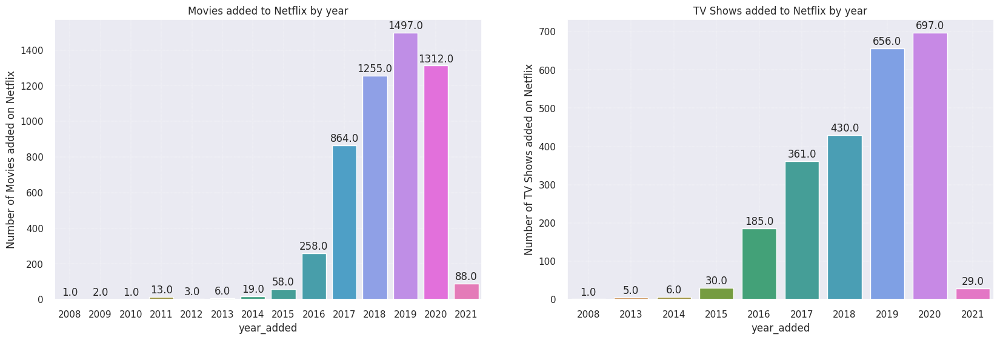

In [34]:
# Extract the year from the date_added column and create a new column 'year_added'
df['year_added'] = df['date_added'].dt.year

# Setting the figure size
plt.figure(figsize=(20, 6))

for i, j, k in ((df[df['type'] == 'Movie'], 'Movies', 0), (df[df['type'] == 'TV Show'], 'TV Shows', 1)):
    plt.subplot(1, 2, k + 1)
    df_added_year = i.groupby(['year_added']).agg({'title': 'nunique'}).reset_index().sort_values(
        by=['year_added'], ascending=False)
    plots = sns.barplot(x='year_added', y='title', data=df_added_year, palette='husl')
    plt.title(f'{j} added to Netflix by year')
    plt.ylabel(f"Number of {j} added on Netflix")
    plt.grid(linestyle='--', linewidth=0.3)

    for bar in plots.patches:
        plt.annotate(bar.get_height(),
                     (bar.get_x() + bar.get_width() / 2,
                      bar.get_height()), ha='center', va='center',
                     size=12, xytext=(0, 8),
                     textcoords='offset points')

plt.show()


##### 1. Why did you pick the specific chart?

> In a year, this graph displays the number of movies and TV shows that are released and added to Netflix.

##### 2. What is/are the insight(s) found from the chart?

> It's evident that Netflix adds a growing quantity of films and television series each year. However, starting in 2018, there have been fewer movies released on Netflix and a noticeable increase in TV series. Regarding the addition of movies and TV shows, there were significantly fewer movies added in 2020 compared to 2019 and more TV shows added in 2020 compared to 2019.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

> Given that the number of TV series added has greatly increased while the number of movies added has decreased since 2018, this could potentially result in negative growth for Netflix. A number of factors, including shifting consumer tastes, heightened competition from other streaming services, and rising film production expenses, could be to blame for this.

>Netflix may look into ways to diversify its content offerings and adjust to shifting consumer preferences in order to lessen the possible negative effects. Investing in a variety of films, TV programs, and other original content, like stand-up comedy specials, limited series, and documentaries, may fall under this category. In the constantly changing streaming market, Netflix can draw in more customers and stay relevant by broadening the kind of material it offers.

#### Chart - 6 The number of movies and TV shows added to Netflix each month

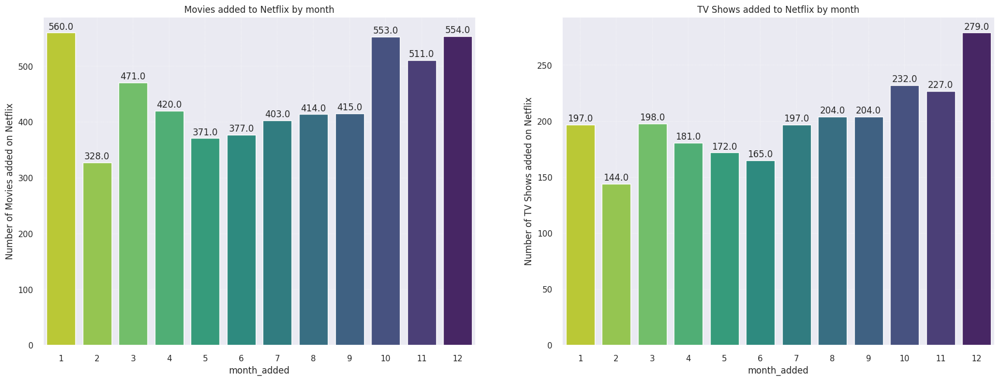

In [35]:
# Extract the month from the date_added column and create a new column 'month_added'
df['month_added'] = df['date_added'].dt.month

# Chart - 6 visualization code
plt.figure(figsize=(23, 8))
for i, j, k in ((df[df['type'] == 'Movie'], 'Movies', 0), (df[df['type'] == 'TV Show'], 'TV Shows', 1)):
    plt.subplot(1, 2, k + 1)
    df_month = i.groupby(['month_added']).agg({'title': 'nunique'}).reset_index().sort_values(by=['month_added'],
                                                                                               ascending=False)
    plots = sns.barplot(x='month_added', y='title', data=df_month, palette='viridis_r')
    plt.title(f'{j} added to Netflix by month')
    plt.ylabel(f"Number of {j} added on Netflix")
    plt.grid(linestyle='--', linewidth=0.3)

    for bar in plots.patches:
        plt.annotate(bar.get_height(),
                     (bar.get_x() + bar.get_width() / 2,
                      bar.get_height()), ha='center', va='center',
                     size=12, xytext=(0, 8),
                     textcoords='offset points')

plt.show()



##### 1. Why did you pick the specific chart?

> Our graph displays the highest number of movies/TV shows added and the lowest number in each year.

##### 2. What is/are the insight(s) found from the chart?

> 1. We discovered that the most popular months for the addition of TV shows are October, November, and December.
2. In terms of movie additions, January, October, and December are the most popular months.
3. The least number of movies and TV series are added to Netflix in February.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

> By determining the most popular months for new content additions, the insights acquired can assist Netflix in having a positive business impact. By doing this, Netflix may better schedule the release of its content during times when its users are most engaged and loyal.
>
>Since February is the least popular month for new content additions, Netflix may experience negative growth if it doesn't continuously release new content during this time. Maintaining viewer engagement throughout the year is crucial for Netflix to prevent discontent and possible subscriber loss.

#### Chart - 7

**commons words in the title**

In [36]:
# movies
movies_df = df[df['type'] == 'Movie']

# tv shows
tv_shows_df = df[df['type'] == 'TV Show']

# getting words in the title of movies
word_cloud_df = movies_df['title']
words_in_title = ' '.join(word for word in word_cloud_df)

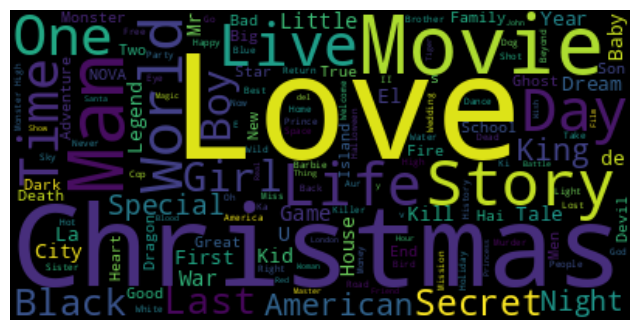

In [37]:
# Chart - 7 visualization code
# stopwords
stop_words = set(STOPWORDS)

# Generating wordcloud image
wordcloud = WordCloud(stopwords=stop_words, background_color='black').generate(words_in_title)

# visualizing wordcloud image
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

**Common words in TV Show's title**

In [38]:
# getting words in the title of movies
word_cloud_df = tv_shows_df['title']
words_in_title = ' '.join(word for word in word_cloud_df)

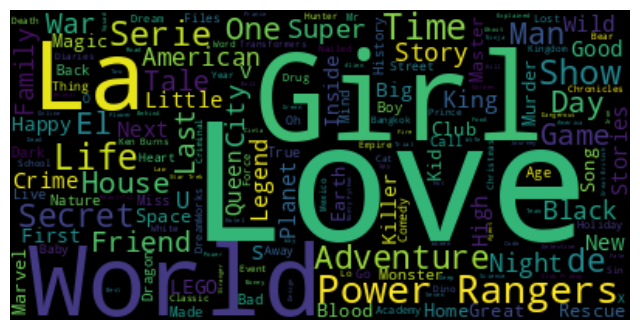

In [39]:
# stopwords
stop_words = set(STOPWORDS)

# Generating wordcloud image
wordcloud = WordCloud(stopwords=stop_words, background_color='black').generate(words_in_title)

# visualizing wordcloud image
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

##### 1. Why did you pick the specific chart?

> The word clouds created by the aforementioned code are created from the descriptions of every show and movie in the Netflix dataset. It's a good idea to quickly view the terms that appear most frequently in the descriptions because this chart visualizes text data. It provides information about the genres and themes of Netflix's television series and films.

##### 2. What is/are the insight(s) found from the chart?

> The wordcloud indicates that the most frequently occurring terms in movie descriptions are Christmas, man, movie, love, etc.

> And for TV shows Love , World , Girl ,LA and Secret

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

> By helping Netflix better understand its users' interests and cater its content to suit those interests, these insights can have a positive business impact. Netflix can enhance user experience and develop more focused marketing campaigns by recognizing popular themes and genres.

#### Chart - 8

**Top 10 Directors**

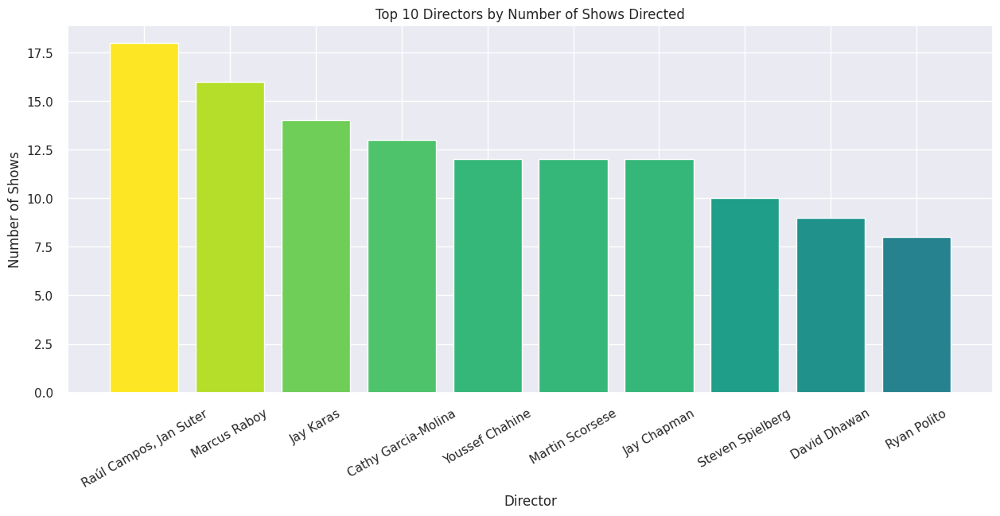

In [40]:
# Chart - 8 visualization code
top_directors = df.loc[df['director'] != 'Unknown', 'director'].value_counts().nlargest(10)
plt.figure(figsize=(15, 6))

# Create a bar plot
bars = plt.bar(top_directors.index, top_directors.values, color=plt.cm.viridis(top_directors.values / top_directors.values.max()))
plt.title('Top 10 Directors by Number of Shows Directed')
plt.xlabel('Director')
plt.ylabel('Number of Shows')
plt.xticks(rotation=30)

plt.show()

##### 1. Why did you pick the specific chart?

> A bar graph showing the top ten directors in the Netflix dataset sorted by the quantity of shows they oversaw. This chart can offer useful insights into the relationship between directors and the number of Netflix shows they have directed. It is a suitable choice for this analysis.

##### 2. What is/are the insight(s) found from the chart?

* Raul Campos and Jan Suter, who each directed 18 shows in the dataset, are the top directors in terms of the number of shows they oversaw.

* Marcus Raboy, the second most popular director, has directed 16 shows.

* Between 7-11 shows on Netflix have been directed by most of the top 10 directors.

* There are mainly US directors in the top 10, with the exception of India's David Dhawan, who directed 9 shows on Netflix

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

> Based on information about the most well-liked directors on Netflix and their previous work, these insights could be useful in making decisions about content production and acquisition.

#### Chart - 9

**duration of Movies and TV Shows**

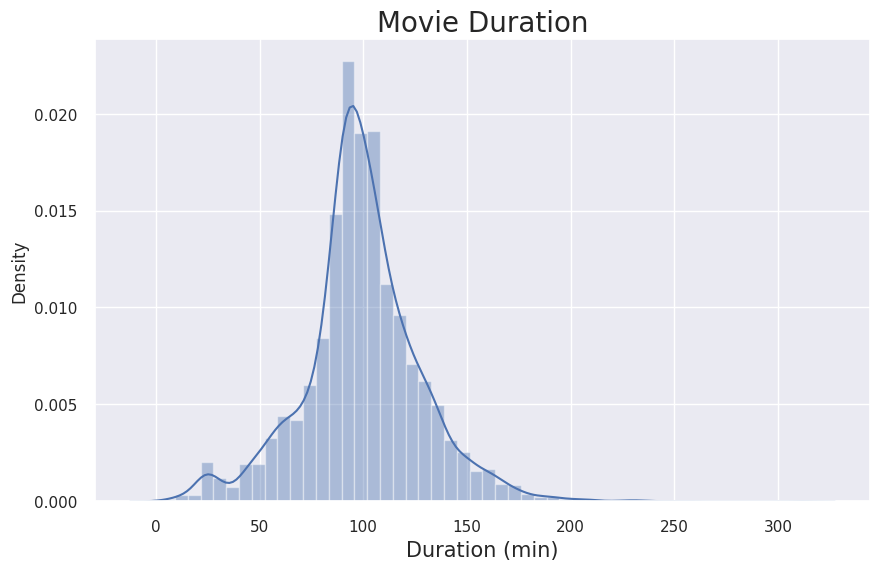

In [41]:
# Chart - 9 visualization code
# Extract movie durations and convert to integers
movies = df[df['type'] == 'Movie']['duration']

# Set the figure size
plt.figure(figsize=(10, 6))

# Visualize distribution plot
sns.distplot(movies)
plt.title("Movie Duration", size=20)
plt.xlabel("Duration (min)", size=15)
plt.show()

**Duration of TV Shows**

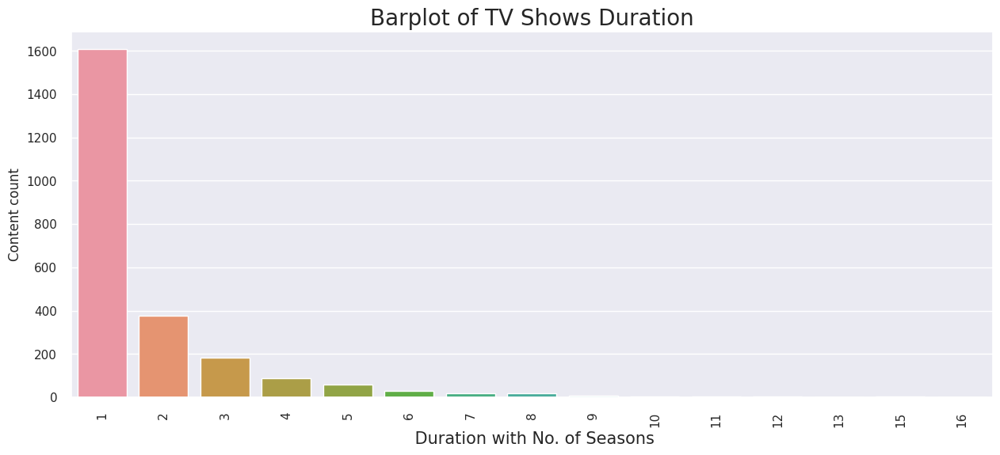

In [42]:
# Extract TV show data
tv_shows = df[df['type'] == 'TV Show']['duration'].value_counts().reset_index().rename(columns={'index': 'No of seasons', 'duration': 'count'})

# Set the figure size
plt.figure(figsize=(15, 6))

# Visualize bar plot
sns.barplot(data=tv_shows, x='No of seasons', y='count')
plt.title("Barplot of TV Shows Duration", size=20)
plt.xlabel(" Duration with No. of Seasons", size=15)
plt.ylabel("Content count")
plt.xticks(rotation='vertical')
plt.show()

##### 1. Why did you pick the specific chart?

> To discover the duration of each Movie and TV Show on Netflix.

##### 2. What is/are the insight(s) found from the chart?

> 1. Most Netflix movies have a runtime of 80 to 120 minutes, according to the histogram of the distribution of movie lengths in minutes.
>
> 2.  season one is the most common length for TV shows on Netflix, followed by two seasons, according to the countplot of the distribution of TV show durations in seasons on the platform.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Yes this will get help to get positive business impact by konwing the duration

#### Chart - 10

**Type of content available on Netflix**

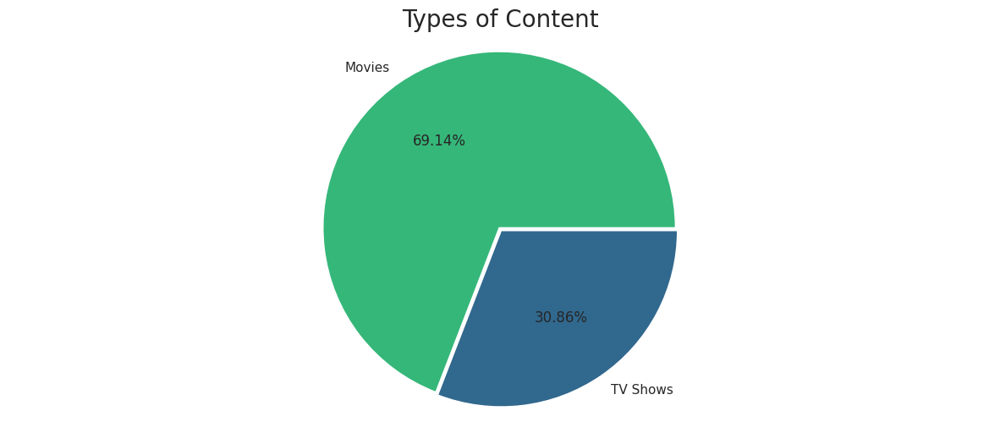

In [43]:
# Chart - 10 visualization code
# Setting the figure size
plt.figure(figsize=(15, 6))

# Visualizing pie chart with a different color scheme
colors = sns.color_palette('viridis_r', len(df['type'].unique()))
plt.pie(df['type'].value_counts(), labels=['Movies', 'TV Shows'], explode=[0.01, 0.01], autopct='%1.2f%%', colors=colors)
plt.title("Types of Content", size=20)
plt.axis('equal')
plt.show()


##### 1. Why did you pick the specific chart?

> The percentage of TV shows and movies in the Netflix dataset is displayed in this graph.

##### 2. What is/are the insight(s) found from the chart?

* Movies, which make up about two thirds of the total content on Netflix, are clearly the most popular type of content. One third of the content is made up of TV shows.
* We can determine that only 30.86 percent of the data set is made up of TV shows, and 69.14 percent is made up of movies.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

* Yes, given the intense competition in the film industry, the production company should prioritize making high-caliber films.
* The lack of TV shows makes it a great opportunity for business.

#### Chart - 11 - Correlation Heatmap

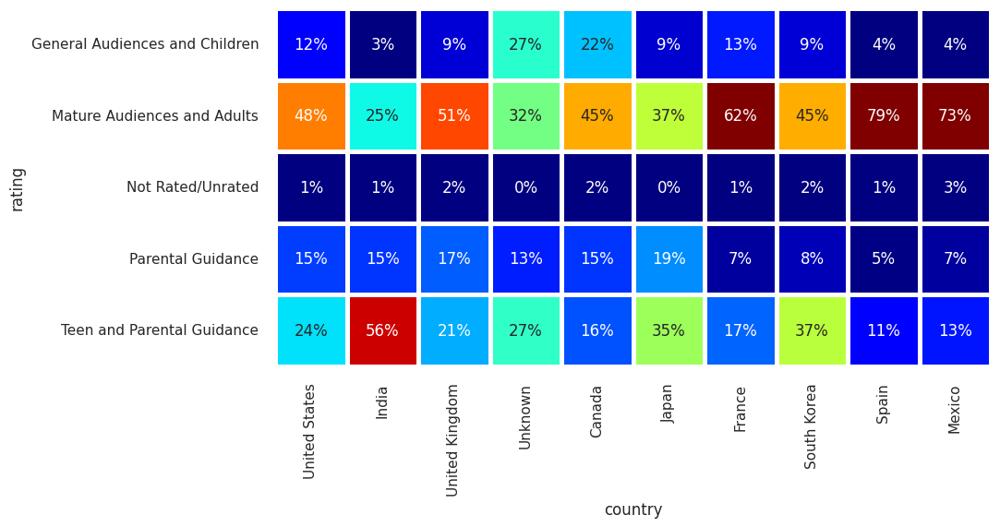

In [44]:
# Add a 'count' column to the DataFrame
df['count'] = 1

# Group by country and sum the counts
data = df.groupby('country')[['country', 'count']].sum().sort_values(by='count', ascending=False).reset_index()[:10]
data = data['country']

# Exclude Germany from the DataFrame
df_heatmap = df.loc[df['country'].isin(data) & (df['country'] != 'Germany')]

# Create a cross-tabulation of 'country' and 'rating' normalized by index
df_heatmap = pd.crosstab(df_heatmap['country'], df_heatmap['rating'], normalize="index").T

# Define the order of ratings and countries
rating_order = df_heatmap.index
country_order = [country for country in data if country != 'Germany']  # Exclude Germany from the x-axis

# Ensure all countries are present in the index
df_heatmap = df_heatmap.reindex(index=rating_order, columns=country_order)

# Plotting the heatmap
fig, ax = plt.subplots(1, 1, figsize=(10, 8))

# Calling and plotting heatmap
sns.heatmap(df_heatmap, cmap="jet", square=True, linewidth=2.5, cbar=False, annot=True, fmt='1.0%',
            vmax=.6, vmin=0.05, ax=ax, annot_kws={"fontsize": 12})

plt.show()

##### 1. Why did you pick the specific chart?

> The graph reveals the top producing countries for each type of content.

##### 2. What is/are the insight(s) found from the chart?

* Based on our research, the majority of nations create content for "Mature Audience and Adult" and "Teen and Parental Guide.".
* Compared to teen and parental guide content, India has the least amount of content for mature audiences and adults overall.
* Mature audience and adult content from Spain make up 79% of the content.



#### Chart - 12 - Pair Plot

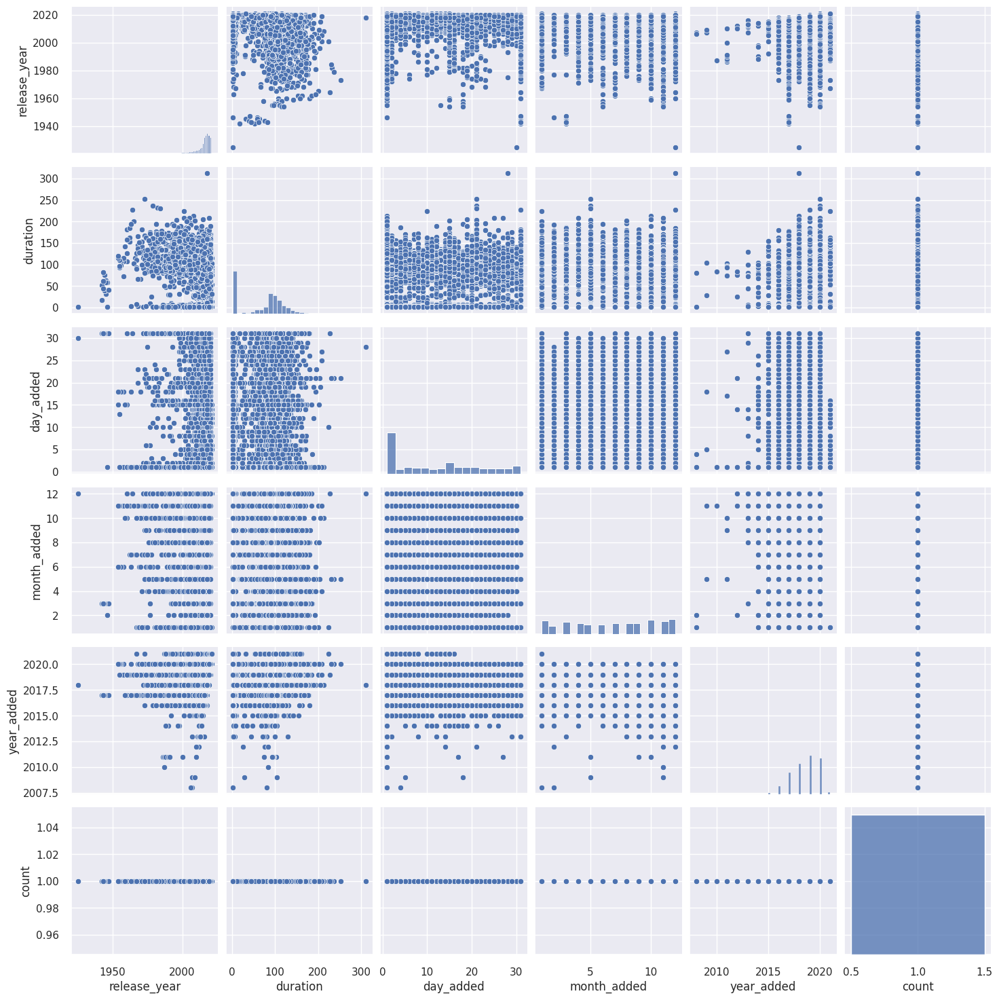

In [45]:
# Pair Plot visualization code
sns.pairplot(df)
plt.show()

##### 1. Why did you pick the specific chart?

> All of the numerical variables in the dataset are shown as a scatter plot matrix in the pair plot, along with diagonal histograms that can be used to see how each pair of variables is related to the other.

##### 2. What is/are the insight(s) found from the chart?

* The distribution of each variable: The diagonal plots show us each variable's range and distribution. There appears to be a concentration in specific ranges for the duration distribution of TV shows and movies.
* Correlation between variables: Each pair of variables' scatter plots are displayed, along with the correlation coefficient, in the upper-right corner of each figure. A positive correlation appears to exist between the length of movies and TV shows and their release year, suggesting that more recent productions typically have longer runs.
* Outlier: The scatter plots' data also shows any outliers that may exist. Comparing the duration of one movie to the rest of the dataset, it appears that one exists.

## ***5. Hypothesis Testing***

### Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.

Hypothesis 1 : Netflix's average duration difference between movies and TV shows.

Hypothesis 2 : The proportion of TV shows added on Netflix that are produced in the United States is different from the proportion of movies added on Netflix that are produced in the United States

Hypothesis 3: Over time, Netflix has seen an increase in the number of TV shows added.

### Hypothetical Statement - 1

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

* Null Hypothesis(H0) - There is no significant difference in the Netflix's average duration of movies and TV shows.

* Alternative Hypothesis(H1) - There is significant difference in the Netflix's average duration of movies and TV shows.


#### 2. Perform an appropriate statistical test.

In [46]:
from scipy.stats import ttest_ind

In [47]:
# Perform Statistical Test to obtain P-Value
# Extract the durations of movies and TV shows from the dataset
movie_durations = df[df['type'] == 'Movie']['duration']
tv_show_durations = df[df['type'] == 'TV Show']['duration']

# Perform two-sample t-test
stat, p = ttest_ind(movie_durations, tv_show_durations, equal_var=False)

# Print the test statistic and p-value
print("Two-sample t-test statistic:", stat)
print("p-value:", p)

# Interpret the result
alpha = 0.05
if p > alpha:
    print("Failed to reject null hypothesis.")
else:
    print("Reject null hypothesis.")

Two-sample t-test statistic: 249.87262245461815
p-value: 0.0
Reject null hypothesis.


##### Which statistical test have you done to obtain P-Value?

> The statistical test known as the two-sample t-test was employed to determine the p-value. We want to know if the difference between the sample means is statistically significant or could have happened by chance because we are comparing the means of two independent samples (the lengths of TV shows and movies). For this reason, we chose this test.

##### Why did you choose the specific statistical test?

> The samples must be independent, have a normal distribution, and have unequal variances in order for the two-sample t-test to be used. In this instance, we made the assumption that the two samples are independent and that the lengths of Netflix's TV series and films are normally distributed. Because the nature of the content may cause the variance of TV show and movie durations to differ, the assumption of unequal variances was also made.

### Hypothetical Statement - 2

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

* Null Hypothesis (H0):
The proportion of TV shows added on Netflix that are produced in the United States is equal to the proportion of movies added on Netflix that are produced in the United States.

* Alternative Hypothesis (H1):
The proportion of TV shows added on Netflix that are produced in the United States is different from the proportion of movies added on Netflix that are produced in the United States.

#### 2. Perform an appropriate statistical test.

In [48]:
# Perform Statistical Test to obtain P-Value
from statsmodels.stats.proportion import proportions_ztest

# Calculate the proportion of TV shows and movies produced in the United States
tv_proportion = np.sum(df[df['type'] == 'TV Show']['country'].str.contains('United States')) / len(df[df['type'] == 'TV Show'])
movie_proportion = np.sum(df[df['type'] == 'Movie']['country'].str.contains('United States')) / len(df[df['type'] == 'Movie'])

# Set up the parameters for the z-test
count = [int(tv_proportion * len(df[df['type'] == 'TV Show'])), int(movie_proportion * len(df[df['type'] == 'Movie']))]
nobs = [len(df[df['type'] == 'TV Show']), len(df[df['type'] == 'Movie'])]
alternative = 'two-sided'

# Perform the z-test
z_stat, p_value = proportions_ztest(count=count, nobs=nobs, alternative=alternative)
print('z-statistic: ', z_stat)
print('p-value: ', p_value)

# Set the significance level
alpha = 0.05

# Print the results of the z-test
if p_value < alpha:
    print(f"Reject the null hypothesis.")
else:
    print(f"Fail to reject the null hypothesis.")


z-statistic:  -5.636447616248406
p-value:  1.7359380800364825e-08
Reject the null hypothesis.


##### Which statistical test have you done to obtain P-Value?

> The statistical test used to determine the P-value is a Z test of proportions. It compares the proportion of television shows and movies on Netflix produced in the United States.

##### Why did you choose the specific statistical test?

> Because it is suitable for comparing two proportions and allows us to ascertain whether or not the difference between the two proportions is the result of chance, we selected this particular statistical test.

### Hypothetical Statement - 3

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

* Null Hypothesis (H0): There is no increase in the number of TV shows added to Netflix over time.

* Alternate Hypothesis (H1): Netflix has experienced a statistically significant increase in the number of TV shows added over time.

#### 2. Perform an appropriate statistical test.

In [49]:
from scipy import stats

In [50]:
# Perform Statistical Test to obtain P-Value
# Extract the year from the date_added column
df['year_added'] = pd.DatetimeIndex(df['date_added']).year

# Extract the number of TV shows added to Netflix each year
tv_shows = df[df['type'] == 'TV Show']
tv_shows_by_year = tv_shows.groupby('year_added').size()

# Perform a linear regression to test for a positive slope (i.e., an increase over time)
slope, intercept, r_value, p_value, std_err = stats.linregress(tv_shows_by_year.index, tv_shows_by_year)

# Print the p-value
print("p-value:", p_value)

# Interpret the result
alpha = 0.05
if p_value > alpha:
    print("Failed to reject null hypothesis.")
else:
    print("Reject null hypothesis.")

p-value: 0.062841095395341
Failed to reject null hypothesis.


##### Which statistical test have you done to obtain P-Value?

* The stats . linregress function from the scipy module is used in this code to carry out a linear regression. The regression is used to check for a positive slope, or i.e. E. a gradual rise) in the quantity of TV series that Netflix releases annually.

* Next, based on the regression's findings, the p-value is determined. The evidence against the null hypothesis is measured by a p-value. In this instance, the null hypothesis is that Netflix has not added more TV series over time (i.e. E. because there is no slope. An alternative theory is that Netflix has added more TV series over time (i.e. E. the slope is upward).

##### Why did you choose the specific statistical test?

* In this code, a linear regression with a slope coefficient hypothesis test is the specific statistical test that is used. This makes sense because our goal is to look for trends over time, and modeling the relationship between the year and the quantity of new TV series added to Netflix is made possible by linear regression. The regression's p-value indicates whether the alternative theory—that there is a positive trend—is correct or incorrect.

## ***6. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

In [51]:
# Handling Missing Values & Missing Value Imputation
df.isnull().sum()

show_id         0
type            0
title           0
director        0
cast            0
country         0
date_added      0
release_year    0
rating          0
duration        0
listed_in       0
description     0
day_added       0
month_added     0
year_added      0
count           0
dtype: int64

#### What all missing value imputation techniques have you used and why did you use those techniques?

> The data wrangling section has already been cleared of all missing values.

### 2. Handling Outliers

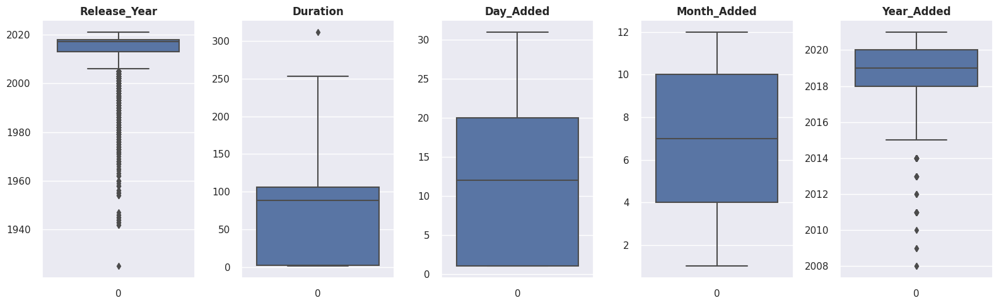

In [52]:
# Handling Outliers & Outlier treatments
# Storing the continous value feature in a separate list
continous_value_feature= ["release_year","duration","day_added","month_added","year_added"]

# checking outliers with the help of box plot for continous features
plt.figure(figsize=(16,5))
for n,column in enumerate(continous_value_feature):
  plt.subplot(1, 5, n+1)
  sns.boxplot(df[column])
  plt.title(f'{column.title()}',weight='bold')
  plt.tight_layout()

##### What all outlier treatment techniques have you used and why did you use those techniques?

> Netflix has released or added movies and TV shows earlier than expected, so even though there are occasional anomalies in our continuous feature, we won't treat them as outliers.

### 3. Textual Data Preprocessing
(It's mandatory for textual dataset i.e., NLP, Sentiment Analysis, Text Clustering etc.)

#### 1. Expand Contraction

In [53]:
# Expand Contraction
df['organized'] =(df['description'].astype(str) + ' ' +
                  df['listed_in'].astype(str)   + ' ' +
                  df['rating'].astype(str)      + ' ' +
                  df['cast'].astype(str)        + ' ' +
                  df['country'].astype(str)     + ' ' +
                  df['director'].astype(str))

In [54]:
df.organized[0]

'In a future where the elite inhabit an island paradise far from the crowded slums, you get one chance to join the 3% saved from squalor. International TV Shows Mature Audiences and Adults João Miguel, Bianca Comparato, Michel Gomes, Rodolfo Valente, Vaneza Oliveira, Rafael Lozano, Viviane Porto, Mel Fronckowiak, Sergio Mamberti, Zezé Motta, Celso Frateschi Brazil Unknown'

#### 2. Lower Casing

In [55]:
# Lower Casing
df['Lower_casing']= df['organized'].str.lower()

In [56]:
df.Lower_casing[0]

'in a future where the elite inhabit an island paradise far from the crowded slums, you get one chance to join the 3% saved from squalor. international tv shows mature audiences and adults joão miguel, bianca comparato, michel gomes, rodolfo valente, vaneza oliveira, rafael lozano, viviane porto, mel fronckowiak, sergio mamberti, zezé motta, celso frateschi brazil unknown'

#### 3. Removing Punctuations

In [57]:
# Remove Punctuations
[punc for punc in string.punctuation]

['!',
 '"',
 '#',
 '$',
 '%',
 '&',
 "'",
 '(',
 ')',
 '*',
 '+',
 ',',
 '-',
 '.',
 '/',
 ':',
 ';',
 '<',
 '=',
 '>',
 '?',
 '@',
 '[',
 '\\',
 ']',
 '^',
 '_',
 '`',
 '{',
 '|',
 '}',
 '~']

In [58]:
# Remove Punctuations
def remove_punctuation(text):
    # remove punctuation from text
    return text.translate(str.maketrans('', '', string.punctuation))


In [59]:
df['cleaned_text'] = df['Lower_casing'].apply(remove_punctuation)

In [60]:
df.cleaned_text[0]

'in a future where the elite inhabit an island paradise far from the crowded slums you get one chance to join the 3 saved from squalor international tv shows mature audiences and adults joão miguel bianca comparato michel gomes rodolfo valente vaneza oliveira rafael lozano viviane porto mel fronckowiak sergio mamberti zezé motta celso frateschi brazil unknown'

#### 4. Removing URLs & Removing words and digits contain digits.

In [61]:
import re

In [62]:
# Remove URLs & Remove words and digits contain digits
def cleaned(x):
    return re.sub(r"[^a-zA-Z ]", "", str(x))

def remove_urls(text):
    cleaned_text = re.sub(r'http\S+', '', text)
    return cleaned_text

def remove_digits(text):
    cleaned_text = re.sub(r'\w*\d\w*', '', text)
    return cleaned_text

In [63]:
df['removed_words']  = df['cleaned_text'].apply(cleaned)
df['removed_url']    = df['removed_words'].apply(remove_urls)
df['removed_digits'] = df['removed_url'].apply(remove_digits)

#### 5. Removing Stopwords & Removing White spaces

In [64]:
# Remove Stopwords
from nltk.corpus import stopwords

In [65]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [66]:
def remove_stopwords(text):
    stop_words = set(stopwords.words('english'))
    words = text.split()
    words = [word for word in words if word not in stop_words]
    cleaned_text = ' '.join(words)
    return cleaned_text

In [67]:
df['removed_stopwords'] = df['removed_digits'].apply(remove_stopwords)
df.removed_stopwords[0]

'future elite inhabit island paradise far crowded slums get one chance join saved squalor international tv shows mature audiences adults joo miguel bianca comparato michel gomes rodolfo valente vaneza oliveira rafael lozano viviane porto mel fronckowiak sergio mamberti zez motta celso frateschi brazil unknown'

In [68]:
# Remove White spaces
def remove_whitespaces(text):
    cleaned_text = text.strip()
    return cleaned_text

In [69]:
df['removed_whitespaces']=df['removed_stopwords'].apply(remove_whitespaces)
df['removed_whitespaces'].head()

0    future elite inhabit island paradise far crowd...
1    devastating earthquake hits mexico city trappe...
2    army recruit found dead fellow soldiers forced...
3    postapocalyptic world ragdoll robots hide fear...
4    brilliant group students become cardcounting e...
Name: removed_whitespaces, dtype: object

#### 7. Tokenization

In [70]:
# Tokenization
def tokenize_text(text):
    tokens = nltk.word_tokenize(text)
    return tokens

In [71]:
df['tokenized'] = df['removed_whitespaces'].apply(tokenize_text)

In [72]:
df['tokenized'].head()

0    [future, elite, inhabit, island, paradise, far...
1    [devastating, earthquake, hits, mexico, city, ...
2    [army, recruit, found, dead, fellow, soldiers,...
3    [postapocalyptic, world, ragdoll, robots, hide...
4    [brilliant, group, students, become, cardcount...
Name: tokenized, dtype: object

#### 8. Text Normalization

In [73]:
import nltk
nltk.download('wordnet')
nltk.download('omw-1.4')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


True

In [74]:
# Normalizing Text (i.e., Stemming, Lemmatization etc.)
def normalize_text(tokens):
    stemmer = SnowballStemmer('english')          # apply stemming to tokens
    stemmed_tokens = [stemmer.stem(token) for token in tokens]
    lemmatizer = WordNetLemmatizer()              # apply lemmatization
    normalized_tokens = [lemmatizer.lemmatize(token) for token in stemmed_tokens]
    normalized_text = ' '.join(normalized_tokens) # join normalized tokens
    return normalized_text

In [75]:
df['normalized'] = df['tokenized'].apply(normalize_text)

In [76]:
df['normalized'].head()

0    futur elit inhabit island paradis far crowd sl...
1    devast earthquak hit mexico citi trap survivor...
2    armi recruit found dead fellow soldier forc co...
3    postapocalypt world ragdol robot hide fear dan...
4    brilliant group student becom cardcount expert...
Name: normalized, dtype: object

##### Which text normalization technique have you used and why?

> For our project, we have combined lemmatization and stemming because: We have combined stemming and lemmatization to address various facets of normalization. Lemmatization is a more sophisticated technique that takes the context into account and produces a base form that is more meaningful, whereas stemming is a more aggressive approach that reduces words to their base form without taking the context into account. Finding a balance between forceful and context-aware normalization can be achieved by combining the two approaches.

#### 9. Text Vectorization

In [77]:
# Vectorizing Text
new_df = df[['title', 'normalized']]
new_df.head()

,title,normalized
0,3%,futur elit inhabit island paradis far crowd sl...
1,7:19,devast earthquak hit mexico citi trap survivor...
2,23:59,armi recruit found dead fellow soldier forc co...
3,9,postapocalypt world ragdol robot hide fear dan...
4,21,brilliant group student becom cardcount expert...


In [78]:
# Vectorizing Text
#using tfidf
from sklearn.feature_extraction.text import TfidfVectorizer

t_vectorizer = TfidfVectorizer(max_features=20000)
x= t_vectorizer.fit_transform(new_df['normalized'])

x.shape

(7777, 20000)

##### Which text vectorization technique have you used and why?

> The text vectorization method called TF-IDF (Term Frequency-Inverse Document Frequency) has been applied by me. Information retrieval and text classification tasks frequently use this technique. Every word in the document is given a weight based on how frequently and rarely it appears in the corpus. This makes it easier to draw attention to the most crucial terms in the text and minimize less important terms that don't offer much insight into the analysis.

### 4. Feature Manipulation & Selection

#### 1. Feature Manipulation

Not needed

#### 2. Feature Selection

Not needed

### 5. Data Transformation

Not needed

### 6. Data Scaling

Not needed

### 7. Dimesionality Reduction

##### Do you think that dimensionality reduction is needed? Explain Why?

* Yes, dimensionality reduction is helpful in simplifying the dataset and enhancing computational efficiency because there are a lot of features (words in this case).

In [79]:
# DImensionality Reduction (If needed)
from sklearn.decomposition import PCA
pca = PCA()
pca.fit(x.toarray())

PCA()

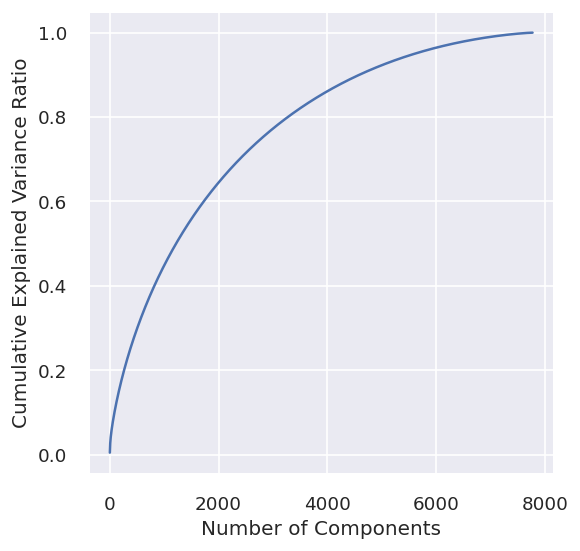

In [80]:
# Calculate the cumulative explained variance ratio
cumulative_var_ratio = np.cumsum(pca.explained_variance_ratio_)

# Plot the cumulative explained variance ratio versus the number of components
plt.figure(figsize=(5, 5), dpi=120)
plt.plot(cumulative_var_ratio)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.show()

In [81]:
pca_tuned = PCA(n_components=0.95)
x_dense = x.toarray()
pca_tuned.fit(x_dense)
x = pca_tuned.transform(x_dense)
print(x.shape)

(7777, 5606)


In [82]:
x

array([[ 0.05709582,  0.02274301, -0.04390081, ..., -0.00848995,
         0.01048818,  0.0057078 ],
       [-0.02790199, -0.04172168, -0.04819473, ..., -0.01228714,
         0.00338418, -0.0156035 ],
       [-0.02207875, -0.03831329, -0.00447736, ...,  0.00536797,
         0.00067085,  0.00188151],
       ...,
       [ 0.11205897,  0.01606342, -0.10116046, ...,  0.0053029 ,
        -0.00326947, -0.00194727],
       [ 0.04469803,  0.090747  ,  0.00366792, ...,  0.0010078 ,
        -0.0002021 ,  0.00527604],
       [ 0.13216698, -0.02323777, -0.10833394, ..., -0.00296868,
        -0.00481573,  0.0040333 ]])

##### Which dimensionality reduction technique have you used and why? (If dimensionality reduction done on dataset.)

* PCA (Principal Component Analysis) has been employed in this code to dimensionality reduction.The initial stage involves fitting a PCA model to the data without specifying the number of components. In order to help us decide how many components to keep, this is done in order to obtain the explained variance ratio for each component.
* After that, a new PCA model is built with n_components set to 0.95, which denotes the desire to retain enough components to account for 95% of the data's variance. In order to obtain the transformed dataset with reduced dimensionality, the transform method is finally applied to the original data.
* The goal of this code is to decrease the dimensionality of text data without losing too much information,to enhance the efficacy of subsequent analysis.

### 8. Data Splitting

Not needed

### 9. Handling Imbalanced Dataset

Not needed

## ***7. ML Model Implementation***

In [83]:
from tabulate import tabulate
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

def evaluate_clustering_model(model, X, y_predict):
    """
    Evaluate a clustering model and print the results.
    & Returns
    Model evaluation result
    """
    # Calculate the number of clusters and evaluation metrics
    n_clusters = len(set(y_predict))
    S_score = silhouette_score(X, y_predict)
    CH_score = calinski_harabasz_score(X, y_predict)
    DB_score = davies_bouldin_score(X, y_predict)

    # Print the evaluation results
    print(f"Number of clusters: {n_clusters}")
    print(f"Silhouette score: {S_score:.4f}")
    print(f"Calinski-Harabasz score: {CH_score:.4f}")
    print(f"Davies-Bouldin score: {DB_score:.4f}")

    # Create a dictionary to store the evaluation scores
    scores_dict = {"silhouette_score": S_score,
                   "calinski_harabasz_score": CH_score,
                   "davies_bouldin_score": DB_score}
                    # Create a dataframe to display the evaluation results
    df_eval = pd.DataFrame({"Evaluation Metric": ["Silhouette Score",
                                                  "Calinski-Harabasz Score",
                                                  "Davies-Bouldin Score"],
                                     "Score": [S_score, CH_score, DB_score]})

    # Print the dataframe
    print(tabulate(df_eval, headers="keys", tablefmt="grid"))

    # Return the evaluation results
    return {"n_clusters": n_clusters,
            "silhouette_score": S_score,
            "calinski_harabasz_score": CH_score,
            "davies_bouldin_score": DB_score}

In [84]:
def plot_clustering_scores(scores_dict):
    """
    Plot the clustering evaluation scores using a bar chart.
    """
    # Extract the scores from the dictionary
    scores = [scores_dict["silhouette_score"], scores_dict["calinski_harabasz_score"], scores_dict["davies_bouldin_score"]]
    labels = ["Silhouette", "Calinski-Harabasz", "Davies-Bouldin"]

    # Plot the scores as a bar chart
    fig, ax = plt.subplots()
    ax.bar(labels, scores, color=["tab:blue", "tab:orange", "tab:green"])

    # Add labels and titles
    ax.set_xlabel("Evaluation Metric")
    ax.set_ylabel("Score")
    ax.set_title("Clustering Evaluation Scores")
    ax.set_ylim([np.min(scores) - 0.1, np.max(scores) + 0.1])
    plt.show()

### ML Model - 1 : K-MEANS CLUSTERING

In [85]:
# ML Model - K-MEANS CLUSTERING
kmeans = KMeans(n_clusters = 3, max_iter = 50)
kmeans.fit(x)

KMeans(max_iter=50, n_clusters=3)

In [86]:
kmeans.labels_

array([2, 2, 2, ..., 2, 0, 2], dtype=int32)

In [87]:
np.array(x)[:, 0]

array([ 0.05709582, -0.02790199, -0.02207875, ...,  0.11205897,
        0.04469803,  0.13216698])

To Find Optimum Numbers of Clusters

* Elbow Method
* silhouette Score

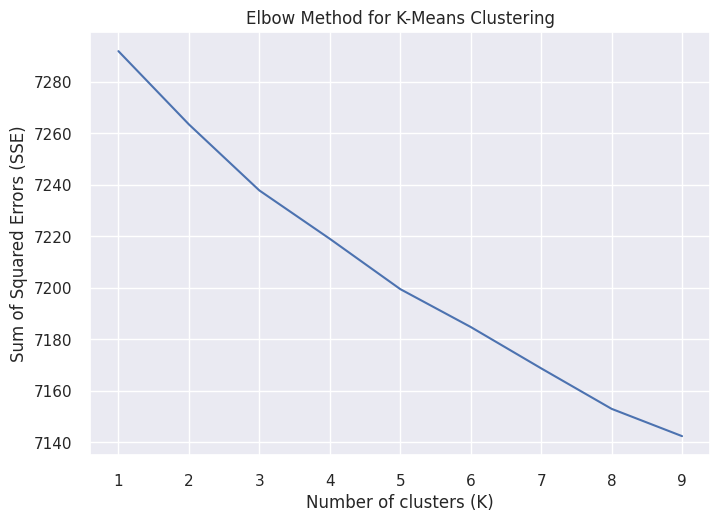

In [88]:
# Create a list to store the sum of squared errors for each K value
Sum_of_Squared_Errors = []

# Iterate over range of K values and compute SSE for each value
for k in range(1, 10):
    # Initialize the k-means model with the current value of K
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    # Fit the model to the data
    kmeans.fit(x)
    # Compute the sum of squared errors for the model
    Sum_of_Squared_Errors.append(kmeans.inertia_)

# Plot the SSE values against the range of K values
plt.plot(range(1, 10), Sum_of_Squared_Errors)
plt.title('Elbow Method for K-Means Clustering')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Sum of Squared Errors (SSE)')
plt.show()

Because of the elbow plot's steep slope, I have reduced the range of possible cluster sizes to between 4 and 7. I will look up each value in this range's silhouette scores and select the one with the highest score to find the ideal number of clusters.

In [89]:
def silhouette_score_analysis(n):
  silhouette_avg = []
  for k in range(2, n):
    # Initialize the k-means model with the current value of k
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    # Fit the model to the data
    kmeans.fit(x)
    # Predict the cluster labels for each point in the data
    labels = kmeans.labels_
    preds = kmeans.fit_predict(x)
    # Compute the silhouette score for the model
    score = silhouette_score(x, labels)
    silhouette_avg.append(score)

    score = silhouette_score(x, preds, metric='euclidean')
    print ("For n_clusters = {}, silhouette score is {}".format(k, score))

    visualizer = SilhouetteVisualizer(kmeans)

    visualizer.fit(x) # Fit the training data to the visualizer
    visualizer.poof() # Draw/show/poof the data

For n_clusters = 2, silhouette score is 0.003828399873823472


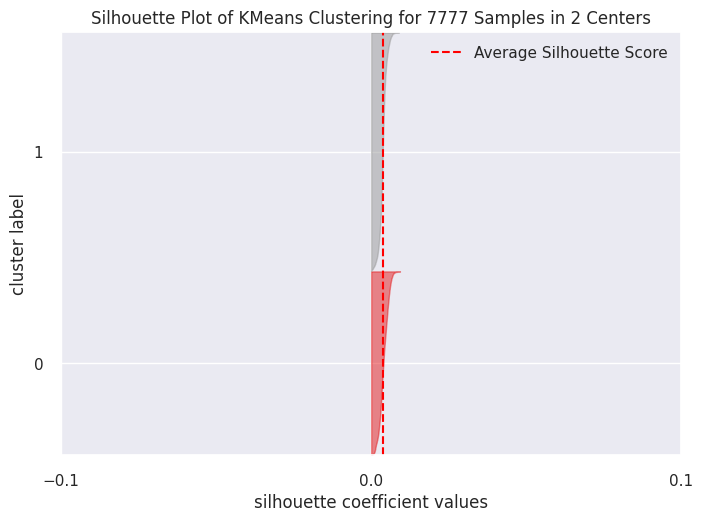

For n_clusters = 3, silhouette score is 0.0029645474788809385


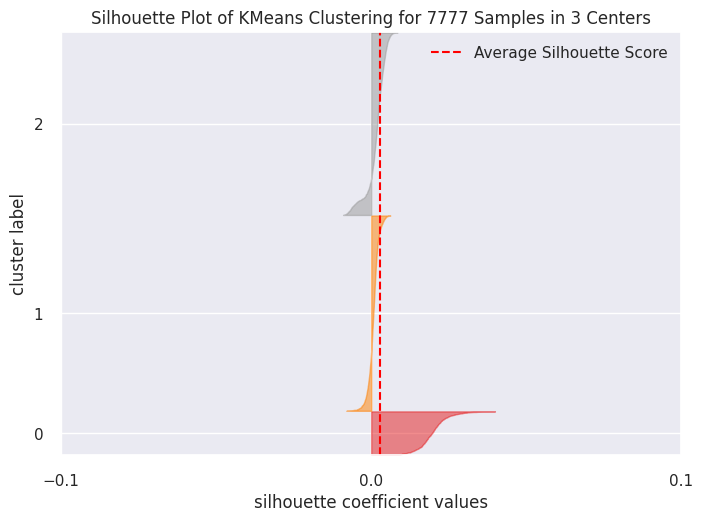

For n_clusters = 4, silhouette score is 0.0038849110852647627


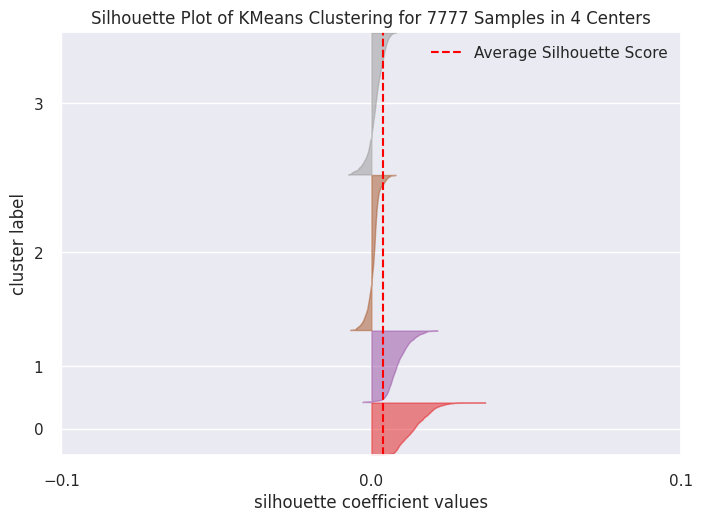

For n_clusters = 5, silhouette score is 0.00448468387659411


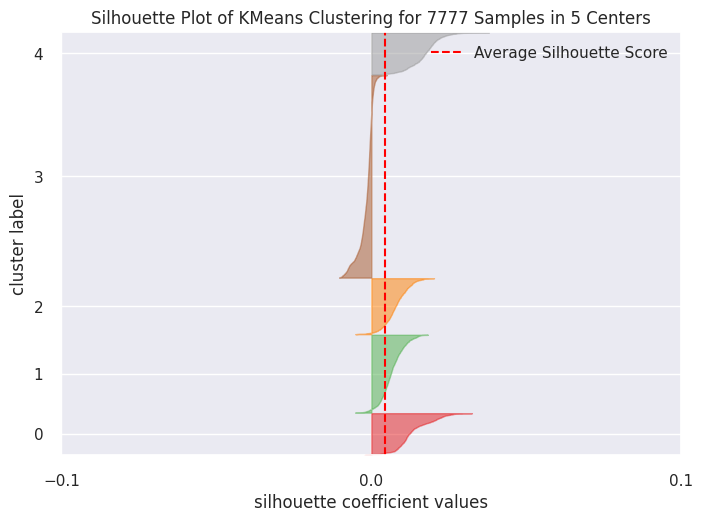

For n_clusters = 6, silhouette score is 0.005143860282083228


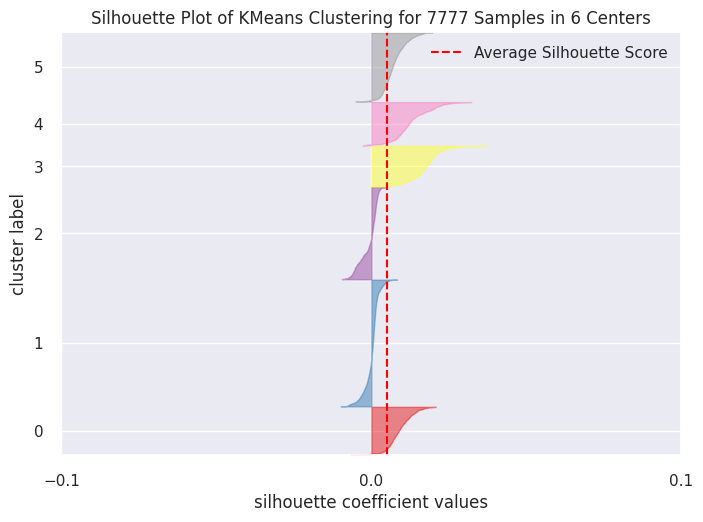

For n_clusters = 7, silhouette score is 0.005732620341634442


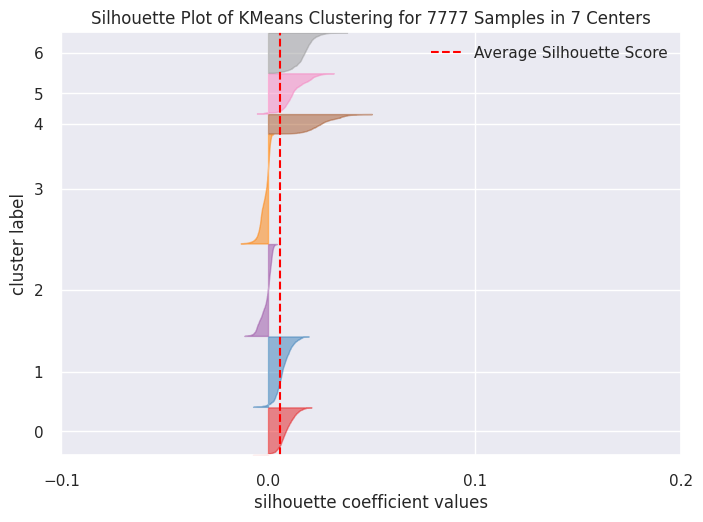

For n_clusters = 8, silhouette score is 0.0056759092586553105


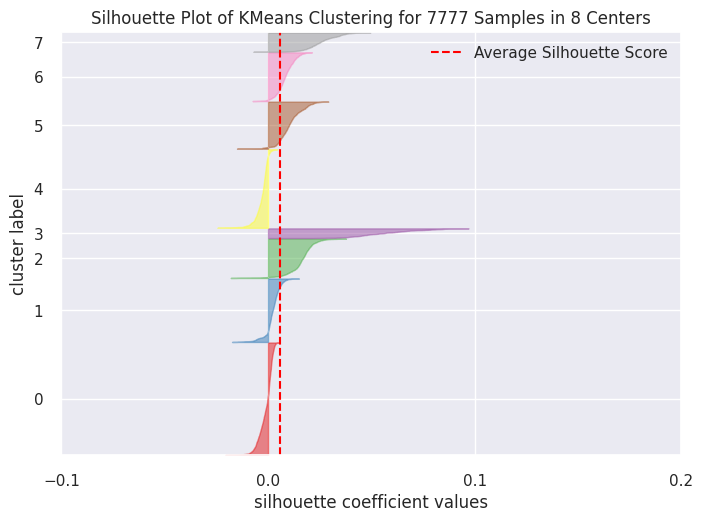

For n_clusters = 9, silhouette score is 0.006212974255254264


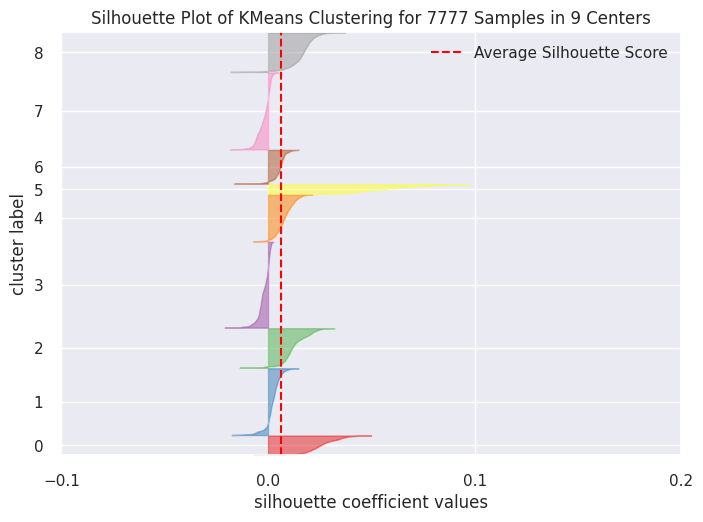

In [90]:
silhouette_score_analysis(10)

>All of the values in the silhouette score visualization above fall between 0 and 1, which suggests that the clusters that are created are distinct and well-defined, and as a result, they are regarded as good.


For n_clusters = 2, silhouette score is 0.003828399873823472
For n_clusters = 3, silhouette score is 0.0029645474788809385
For n_clusters = 4, silhouette score is 0.0038849110852647627
For n_clusters = 5, silhouette score is 0.00448468387659411
For n_clusters = 6, silhouette score is 0.005143860282083228
For n_clusters = 7, silhouette score is 0.005732620341634442


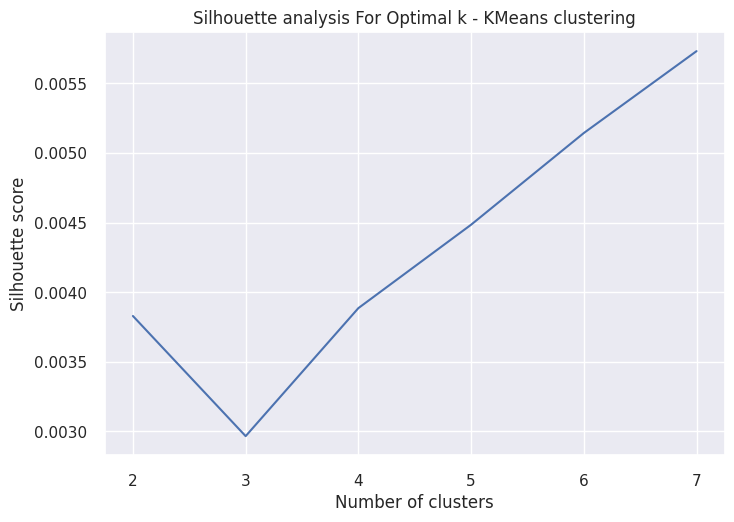

In [91]:
# Silhouette score method to find the optimal value of k
# Initialize a list to store the silhouette score for each value of k
silhouette_avg = []

# Define a list of possible number of clusters
range_n_clusters = [2, 3, 4, 5, 6, 7]

# Loop through each value of k
for n_clusters in range_n_clusters:
    # Initialize the k-means model with the current value of k
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++', random_state=42)
    # Fit the model to the data
    kmeans.fit(x)
    # Predict the cluster labels for each point in the data
    labels = kmeans.labels_
    # Compute the silhouette score for the model
    score = silhouette_score(x, labels)
    # Append the silhouette score to the list of scores
    silhouette_avg.append(score)
    # Print the silhouette score for the current value of k
    print("For n_clusters = {}, silhouette score is {}".format(n_clusters, score))

# Plot the Silhouette analysis
plt.plot(range_n_clusters, silhouette_avg)
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k - KMeans clustering')
plt.show()

In [ ]:
# ML Model - 1 Implementation
# Initialize the KMeans model with the chosen number of clusters
kmeans_model = KMeans(n_clusters=7, random_state=42)
# Fit the Algorithm
kmeans_model.fit(x)
# Predict on the model
y_kmeans = kmeans_model.predict(x)
labels = kmeans_model.labels_     # Get the cluster labels for each point in the data
unique_labels = np.unique(labels) # Get the unique cluster labels

In [93]:
df['kmeans_cluster'] = labels

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [ ]:
# Visualizing evaluation Metric Score chart
scores_dict_kmeans = evaluate_clustering_model(kmeans_model, x, y_kmeans)

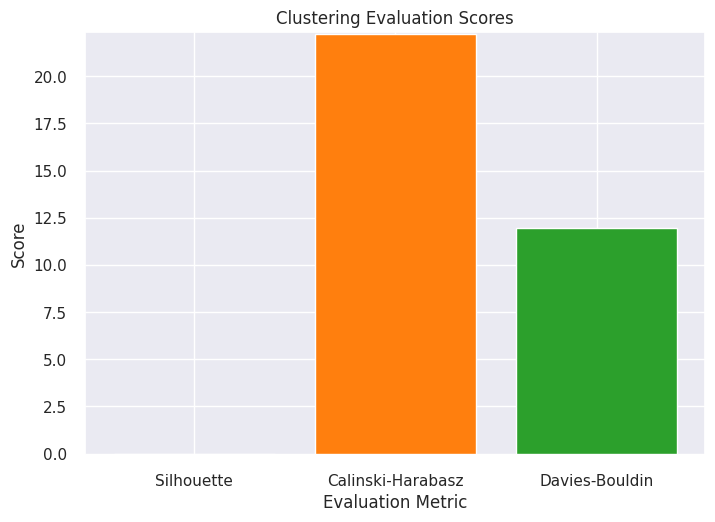

In [95]:
# Visualizing evaluation Metric Score chart
plot_clustering_scores(scores_dict_kmeans)

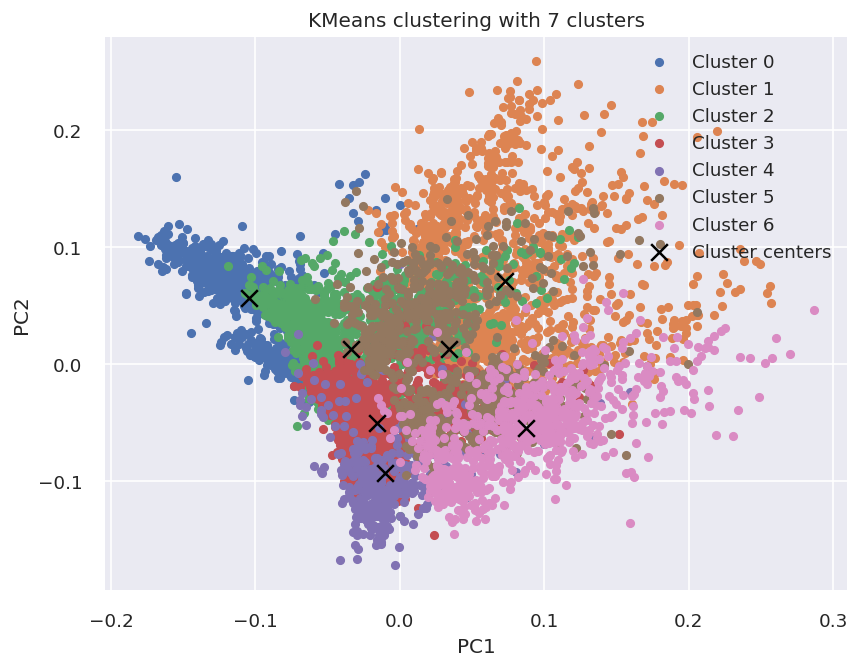

In [131]:
plt.figure(figsize=(8, 6), dpi=120)
for i in unique_labels:
    plt.scatter(x[labels == i, 0], x[labels == i, 1], s=20, label='Cluster {}'.format(i))
plt.scatter(kmeans_model.cluster_centers_[:, 0], kmeans_model.cluster_centers_[:, 1], s=100, marker='x', c='black', label='Cluster centers')
plt.title('KMeans clustering with {} clusters'.format(len(unique_labels)))
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend()
plt.show()

In [97]:
def kmeans_wordcloud(cluster_number, column_name):
    '''function for Building a wordcloud for the movie/shows'''

    # Filter the data by the specified cluster number and column name
    df_wordcloud = df[['kmeans_cluster', column_name]].dropna()
    df_wordcloud = df_wordcloud[df_wordcloud['kmeans_cluster'] == cluster_number]

    # Combine all text documents into a single string
    text = " ".join(word for word in df_wordcloud[column_name])

    # Create the word cloud
    wordcloud = WordCloud(stopwords=set(STOPWORDS), background_color="white").generate(text)

    # Convert the wordcloud to a numpy array
    image_array = wordcloud.to_array()

    # Return the numpy array
    return image_array

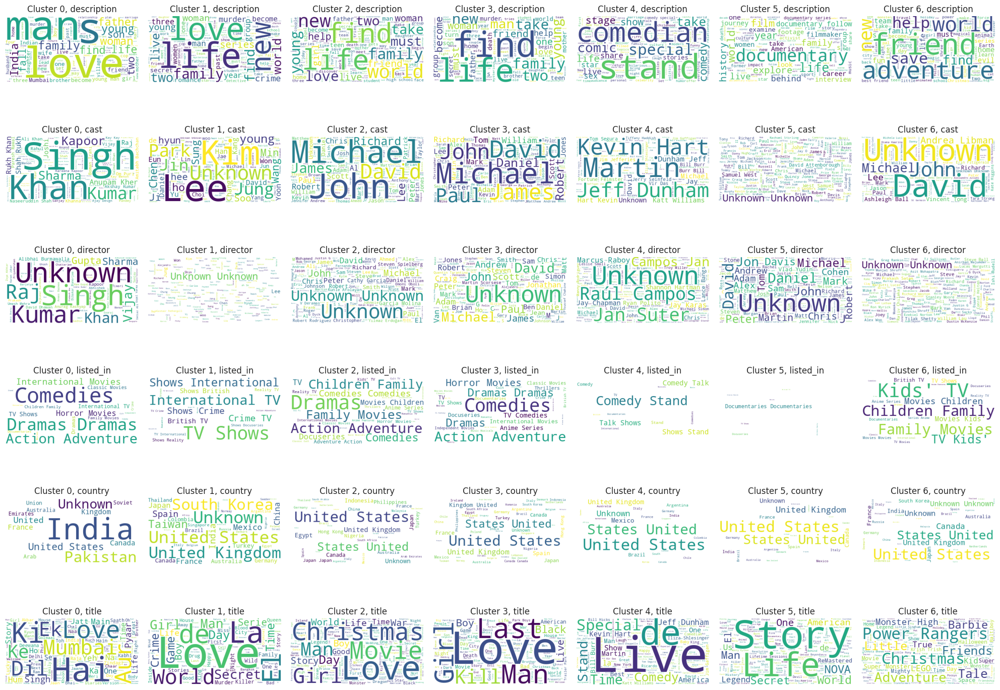

In [98]:
fig, axs = plt.subplots(nrows=6, ncols=7, figsize=(20, 15))

for i in range(7):
    for j, col in enumerate(['description', 'cast', 'director', 'listed_in', 'country', 'title']):
        axs[j][i].imshow(kmeans_wordcloud(i, col))
        axs[j][i].axis('off')
        axs[j][i].set_title(f'Cluster {i}, {col}')

plt.tight_layout()
plt.show()

### ML Model - 2 HIERARCHICAL CLUSTERING

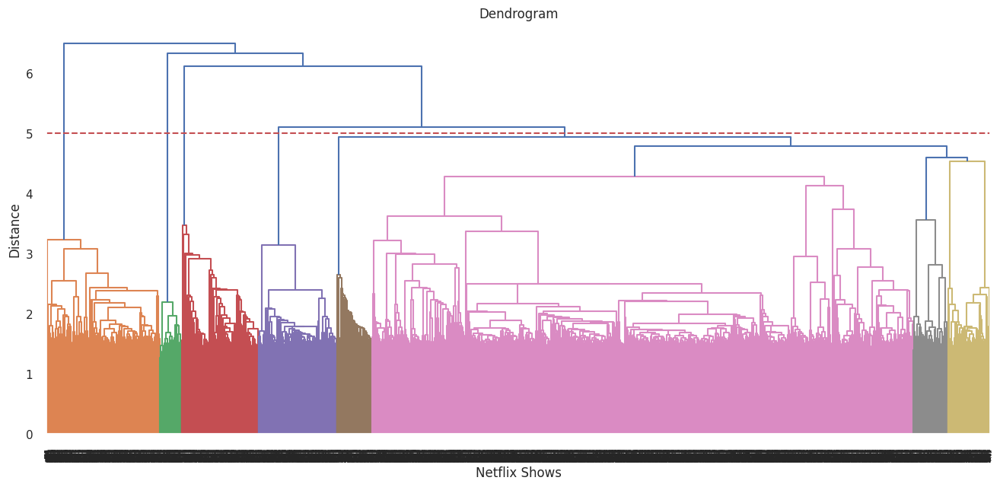

In [132]:
import scipy.cluster.hierarchy as shc

plt.figure(figsize=(16, 7))
dend = shc.dendrogram(shc.linkage(x, method='ward'))
plt.title('Dendrogram')
plt.xlabel('Netflix Shows')
plt.ylabel('Distance')
plt.axhline(y=5, color='r', linestyle='--')

plt.show()

> The horizontal line cuts 5 branches, so we will choose the number of clusters as 5.

In [133]:
# ML Model - 2  Implementation
# Initialize the hierarchical model with the chosen number of clusters
hierarchical_model = AgglomerativeClustering(n_clusters=5, affinity='euclidean', linkage='ward')
# Fit and predict on the model
y_hierarchical = hierarchical_model.fit_predict(x)
hierarchical_labels = hierarchical_model.labels_  # Get the cluster labels for each point in the data
unique_labels_h = np.unique(hierarchical_labels)  # Get the unique cluster labels
silhouette_avg = silhouette_score(x, hierarchical_labels)   # Calculate the silhouette score
print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.0010768980774843921


In [134]:
df['hierarchical_cluster'] = hierarchical_labels

#### **1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.**

In [135]:
# Visualizing evaluation Metric Score chart
scores_dict_hierarchical = evaluate_clustering_model(hierarchical_model, x, y_hierarchical)

Number of clusters: 5
Silhouette score: 0.0011
Calinski-Harabasz score: 19.6418
Davies-Bouldin score: 10.7828
+----+-------------------------+------------+
|    | Evaluation Metric       |      Score |
+====+=========================+============+
|  0 | Silhouette Score        |  0.0010769 |
+----+-------------------------+------------+
|  1 | Calinski-Harabasz Score | 19.6418    |
+----+-------------------------+------------+
|  2 | Davies-Bouldin Score    | 10.7828    |
+----+-------------------------+------------+


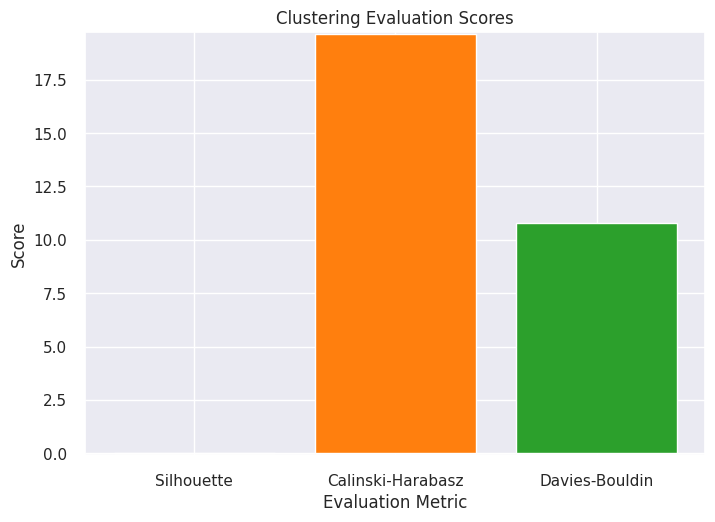

In [136]:
plot_clustering_scores(scores_dict_hierarchical)

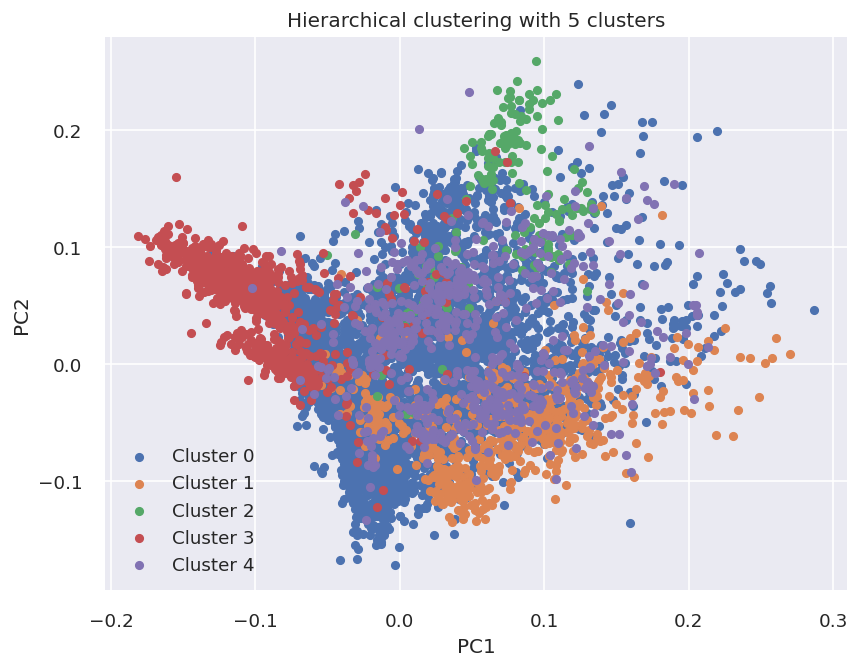

In [104]:
# Create a scatter plot of the data colored by cluster label
plt.figure(figsize=(8, 6), dpi=120)
for i in unique_labels_h:
    plt.scatter(x[hierarchical_labels == i, 0], x[hierarchical_labels == i, 1], s=20, label='Cluster {}'.format(i))
#plt.scatter(hierarchical_model.cluster_centers_[:, 0], hierarchical_model.cluster_centers_[:, 1], s=100, marker='x', c='black')
plt.title('Hierarchical clustering with {} clusters'.format(len(unique_labels_h)))
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend()
plt.show()


In [137]:
def hierarchical_wordcloud(cluster_number, column_name):

  '''function for Building a wordcloud for the movie/shows'''

  # Filter the data by the specified cluster number and column name
  df_wordcloud = df[['hierarchical_cluster', column_name]].dropna()
  df_wordcloud = df_wordcloud[df_wordcloud['hierarchical_cluster'] == cluster_number]

  # Combine all text documents into a single string
  text = " ".join(word for word in df_wordcloud[column_name])

  # Create the word cloud
  wordcloud = WordCloud(stopwords=set(STOPWORDS), background_color="white").generate(text)

  # Return the word cloud object
  return wordcloud

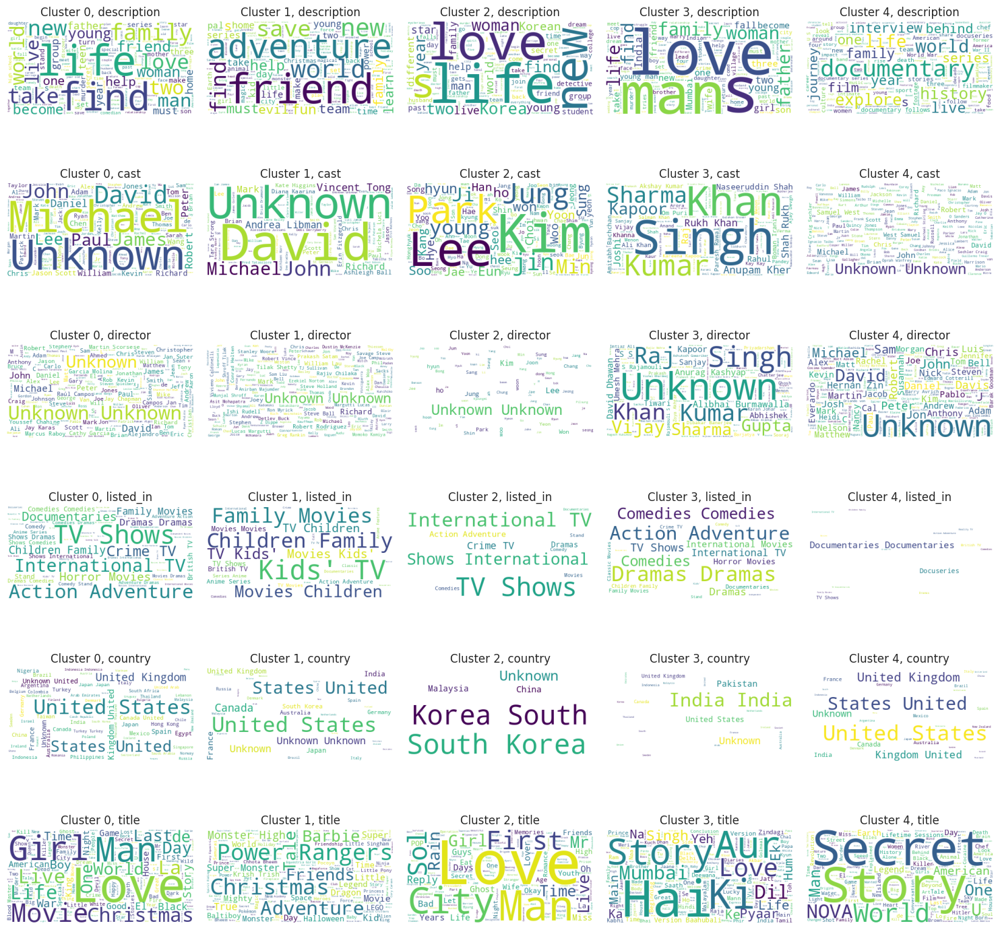

In [138]:
fig, axs = plt.subplots(nrows=6, ncols=5, figsize=(15, 15))

for i in range(5):
    for j, col in enumerate(['description', 'cast', 'director', 'listed_in', 'country', 'title']):
        axs[j][i].imshow(hierarchical_wordcloud(i, col))
        axs[j][i].axis('off')
        axs[j][i].set_title(f'Cluster {i}, {col}')

plt.tight_layout()
plt.show()

### ML Module-3 DBSCAN Clustering

In [139]:
# Create an instance of DBSCAN with specified hyperparameters
dbscan_model = DBSCAN(eps=0.7, min_samples=3)
dbscan_model.fit(x) # Fit the model to the input data
y_dbscan = dbscan_model.labels_ # Get the predicted cluster labels for the input data
dbscan_labels = dbscan_model.labels_
unique_labels_dbscan = np.unique(dbscan_labels)
print(y_dbscan)

[-1 -1 -1 ... -1 -1 -1]


In [108]:
df['dbscan_cluster'] = dbscan_labels

**1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.**

In [140]:
# Visualizing evaluation Metric Score chart
scores_dict_dbscan = evaluate_clustering_model(dbscan_model, x, y_dbscan)

Number of clusters: 19
Silhouette score: -0.0160
Calinski-Harabasz score: 2.8535
Davies-Bouldin score: 1.4446
+----+-------------------------+------------+
|    | Evaluation Metric       |      Score |
+====+=========================+============+
|  0 | Silhouette Score        | -0.0159839 |
+----+-------------------------+------------+
|  1 | Calinski-Harabasz Score |  2.85347   |
+----+-------------------------+------------+
|  2 | Davies-Bouldin Score    |  1.44464   |
+----+-------------------------+------------+


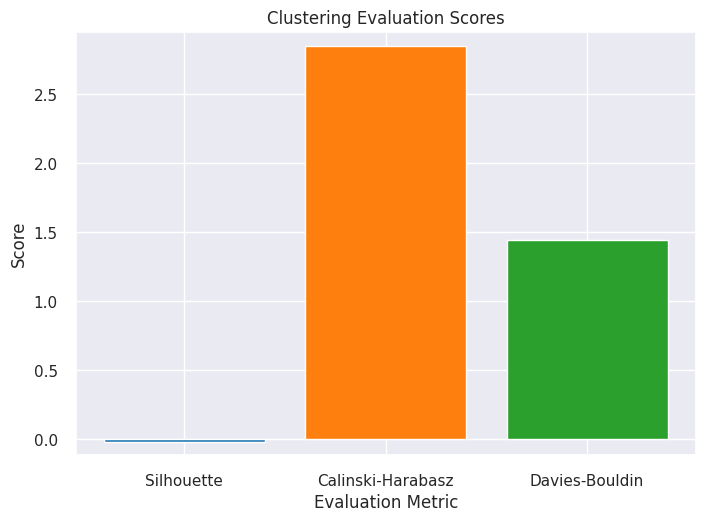

In [141]:
plot_clustering_scores(scores_dict_dbscan)

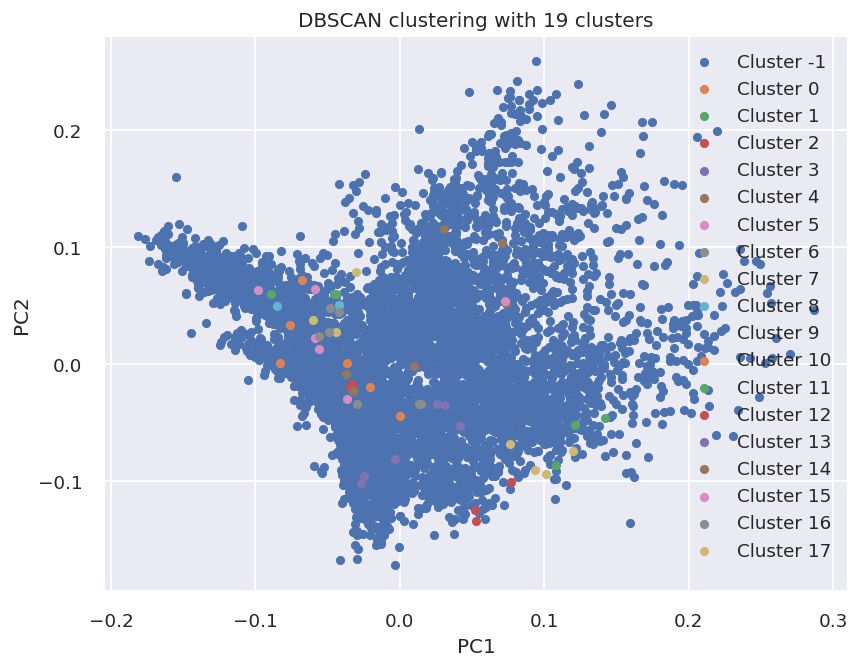

In [142]:
# Create a scatter plot of the data colored by cluster label
plt.figure(figsize=(8, 6), dpi=120)
for i in unique_labels_dbscan:
    plt.scatter(x[dbscan_labels == i, 0], x[dbscan_labels == i, 1], s=20, label='Cluster {}'.format(i))
plt.title('DBSCAN clustering with {} clusters'.format(len(unique_labels_dbscan)))
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend()
plt.show()

In [143]:
def dbscan_wordcloud(cluster_number, column_name):

  '''function for Building a wordcloud for the movie/shows'''

  # Filter the data by the specified cluster number and column name
  df_wordcloud = df[['dbscan_cluster', column_name]].dropna()
  df_wordcloud = df_wordcloud[df_wordcloud['dbscan_cluster'] == cluster_number]

  # Combine all text documents into a single string
  text = " ".join(word for word in df_wordcloud[column_name])

  # Create the word cloud
  wordcloud = WordCloud(stopwords=set(STOPWORDS), background_color="white").generate(text)

  # Return the word cloud object
  return wordcloud

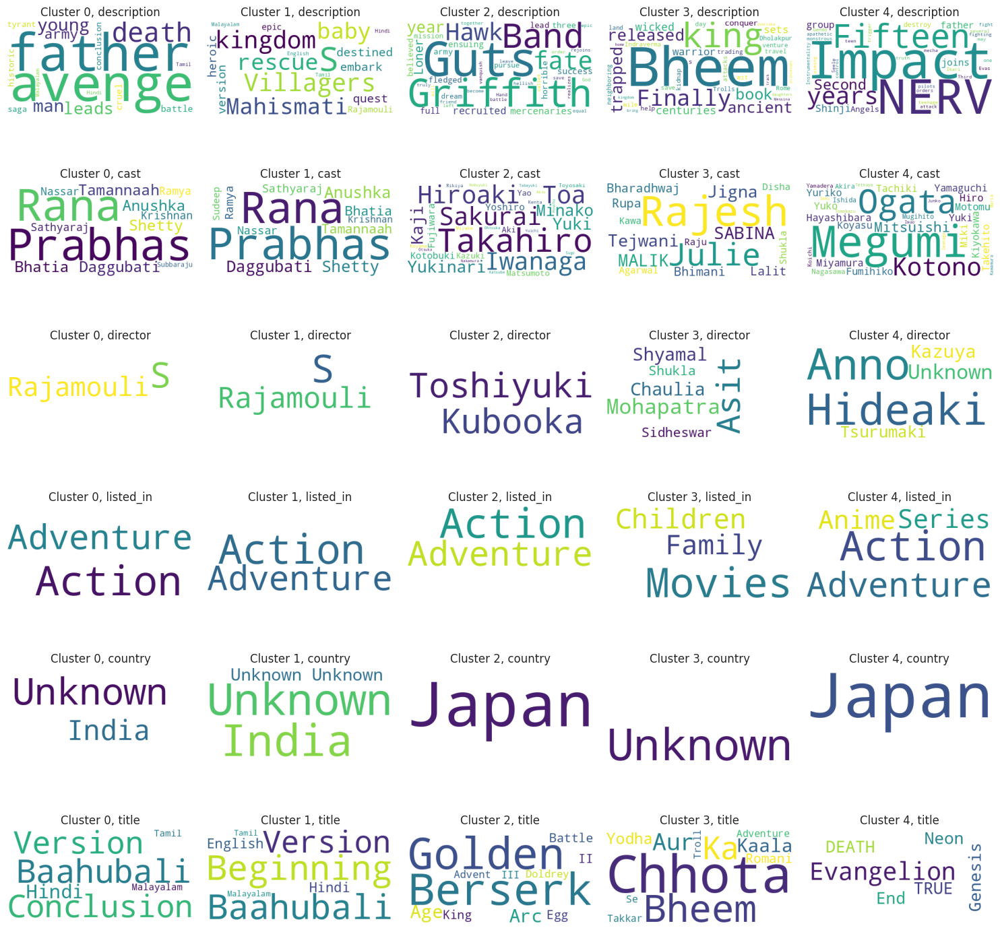

In [144]:
fig, axs = plt.subplots(nrows=6, ncols=5, figsize=(15, 15))

for i in range(5):
    for j, col in enumerate(['description', 'cast', 'director', 'listed_in', 'country', 'title']):
        axs[j][i].imshow(dbscan_wordcloud(i, col))
        axs[j][i].axis('off')
        axs[j][i].set_title(f'Cluster {i}, {col}')

plt.tight_layout()
plt.show()

#### RECOMMENDATION SYSTEM

In [145]:
# ML Model - 3 Implementation
# Create a TF-IDF vectorizer object and transform the text data
tfidf = TfidfVectorizer(stop_words='english')
tfidf_matrix = tfidf.fit_transform(new_df['normalized'])

# Compute cosine similarity matrix
cosine_sim = cosine_similarity(tfidf_matrix)

def generate_recommendations(title, cosine_sim=cosine_sim, data=new_df):
    # Get the index of the input title in the programme_list
    programme_list = data['title'].to_list()
    index = programme_list.index(title)

    # Create a list of tuples containing the similarity score and index
    # between the input title and all other programmes in the dataset
    sim_scores = list(enumerate(cosine_sim[index]))

    # Sort the list of tuples by similarity score in descending order
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)[1:11]

    # Get the recommended movie titles and their similarity scores
    recommend_index = [i[0] for i in sim_scores]
    rec_movie = data['title'].iloc[recommend_index]
    rec_score = [round(i[1], 4) for i in sim_scores]

    # Create a pandas DataFrame to display the recommendations
    rec_table = pd.DataFrame(list(zip(rec_movie, rec_score)),
                             columns=['Recommended movie', 'Similarity score (0-1)'])

    return rec_table

In [115]:
generate_recommendations('Stranger Things')

,Recommended movie,Similarity score (0-1)
0,Beyond Stranger Things,0.5247
1,Prank Encounters,0.1384
2,Eli,0.1086
3,The Darkness,0.1041
4,Kiss Me First,0.0950
5,"Frankenstein’s Monster’s Monster, Frankenstein",0.0906
6,In The Deep,0.0896
7,Kicking and Screaming,0.0892
8,American Odyssey,0.0877
9,The World We Make,0.0863


In [146]:
generate_recommendations('Phir Hera Pheri')

,Recommended movie,Similarity score (0-1)
0,Bhool Bhulaiyaa,0.2369
1,Thank You,0.2036
2,Golmaal: Fun Unlimited,0.1969
3,Darr Sabko Lagta Hai,0.1928
4,Bhagam Bhag,0.1921
5,Chup Chup Ke,0.1848
6,Ready,0.1820
7,Life Ki Toh Lag Gayi,0.1694
8,Khushi,0.1676
9,Hello Brother,0.1668


In [147]:
generate_recommendations('Black Panther')

,Recommended movie,Similarity score (0-1)
0,Da 5 Bloods,0.1394
1,Mowgli: Legend of the Jungle,0.1339
2,Fruitvale Station,0.1242
3,Avengers: Infinity War,0.1148
4,Star Wars: Episode VIII: The Last Jedi,0.1144
5,Lee Daniels' The Butler,0.0981
6,The Angry Birds Movie 2,0.0904
7,Undefeated,0.0902
8,Bad Rap,0.0892
9,The Lies Within,0.0866


### 1. Which Evaluation metrics did you consider for a positive business impact and why?

1. Silhouette score:
* A well-liked evaluation metric for clustering algorithms is the silhouette score. In comparison to other clusters, it assesses how well each data point fits into the designated cluster. A higher score denotes better-defined clusters; the score ranges from -1 to 1.

* The silhouette score can be used to determine the ideal number of clusters for a dataset, making it a valuable metric for positive business impact. As a result, businesses will be better equipped to allocate resources and make data-driven decisions based on the unique patterns and attributes of each cluster.

2. Calinski-Harabasz score:
* This score, sometimes referred to as the variance ratio criterion, quantifies the relationship between the within- and between-cluster dispersions. It is computed by multiplying the ratio of the number of observations to the number of clusters minus one by the ratio of the sum of squares within groups to the sum of squares between groups.

* Stated differently, the Calinski-Harabasz score quantifies the degree to which the data's clusters are internally compact and well-separated. A higher score denotes compactness and good separation of the clusters, whereas a lower score denotes neither compactness nor well separation of the clusters.

3. Davies-Bouldin score:
* This is a ratio of average similarity to average dissimilarity between each cluster and its least similar cluster. It illustrates how similar each cluster is to its most similar cluster. It is computed by dividing the total number of clusters by the product of the within-cluster scatter and between-cluster distance ratios.

* Stated differently, the Davies-Bouldin score quantifies the degree to which the data's clusters are clearly separated from one another and from one another. A higher score denotes that the clusters are not well separated or are not distinct from one another, whereas a lower score indicates that the clusters are distinct and well separated.

### 2. Which ML model did you choose from the above created models as your final prediction model and why?

In [148]:
# Storing metrics in order to make dataframe of metrics
Model          = ['K-Means Clustering', 'Hierarchical Clustering', 'DBSCAN Clustering']
S_score  = [ 0.0057,  0.0010,-0.0159]
CH_score = [22.2524, 19.6418,  2.8534]
DB_score = [11.9382, 10.7828, 1.4446]
No_of_cluster = [7, 5, 19]
# Create dataframe from the lists
data = {'Model' : Model,
        'Number of clusters': No_of_cluster,
        'silhouette_score'  : S_score,
        'calinski_harabasz_score': CH_score,
        'davies_bouldin_score': DB_score}
Metric_df = pd.DataFrame(data)

# Printing dataframe
Metric_df

,Model,Number of clusters,silhouette_score,calinski_harabasz_score,davies_bouldin_score
0,K-Means Clustering,7,0.0057,22.2524,11.9382
1,Hierarchical Clustering,5,0.0010,19.6418,10.7828
2,DBSCAN Clustering,19,-0.0159,2.8534,1.4446


* After evaluating multiple machine learning models including K-Means Clustering, Hierarchical Clustering - Agglomerative, DBSCAN Clustering and Recommender System, we selected K-Means Clustering as our final prediction model.
* Because K-Means Clustering performed well in terms of accuracy and computing efficiency on our evaluation dataset, we decided to go with it. Our ability to provide consumers with more relevant recommendations was made possible by the model's ability to group related films and TV series together based on their shared characteristics. K-Means Clustering was a realistic choice for our project because it was also rather simple to install and maintain.
* Although DBSCAN Clustering and Hierarchical Clustering - Agglomerative also produced encouraging results, they were more computationally expensive and took longer to complete. However, the Recommender System's capacity to group TV series and films according to common characteristics was constrained, and it was primarily dependent on user behavior data for recommendation purposes.
* The K-Means Clustering Model outperforms Hierarchical Clustering in terms of the calinski_harabasz_score (higher than others) and Davies-Bouldin score (lower than others), and DBSCAN Clustering also produces a good silhouette score.
* Our final prediction model is K-Means Clustering because it is accurate, efficient, and practical for making recommendations to our users.

## ***8.*** ***Future Work (Optional)***

### 1. Save the best performing ml model in a pickle file or joblib file format for deployment process.


In [119]:
# Save the File

### 2. Again Load the saved model file and try to predict unseen data for a sanity check.


In [120]:
# Load the File and predict unseen data.

### ***Congrats! Your model is successfully created and ready for deployment on a live server for a real user interaction !!!***

# **Conclusion**

**EDA**
* Netflix's platform has a larger selection of movies than TV shows.
* Most of the content on Netflix has a TV-MA rating, meaning that it is appropriate for mature audiences.
* In terms of productions available on Netflix, the United States is the top country, followed by India and the United Kingdom.
* Since its inception in 2008, Netflix's content library has been steadily increasing.
* Dramas are the most popular genre on Netflix, with comedies and documentaries coming in second and third.
* Love,  Christmas, man, movie,family, young, life, and world are among the most frequently used words in Netflix movie descriptions,and for TV shows Love , World , Girl ,LA and Secret according to the Wordcloud visualization of movie descriptions.
* A moderate positive correlation exists between the duration of a movie and its release year as shown in the correlation heatmap.
* A negative correlation between a movie's duration and rating, as well as a strong positive correlation between the number of reviews and the year of release, are just two of the intriguing patterns between variables that the pairplot displays.



#### **conclusion based on implementation of the model**
* Based on director, cast, country, genre, rating, and description, the data was clustered accordingly.
* The values in these attributes were tokenized, preprocessed, and vectorized using the TFIDF vectorizer, yielding a total of 10,000 attributes.
* The data's dimension was reduced by PCA (principal componenet analysis), which covered more than 95% of the variance.
* The elbow method and Silhouette score analysis indicated that 7 was the ideal number of clusters to be built using the K-Means Clustering algorithm.
* The dendrogram visualization indicated that there should be 5 clusters when using the agglomerative clustering algorithm to create the clusters.
* Based on the type of show watched, a content-based recommender system built using cosine similarity will make 10 recommendations to the user
* After being developed, DBSCAN clustering yields an ideal number of clusters of 17, with a very low metric score.

### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***